In [2339]:
from mplsoccer import Pitch, VerticalPitch
from statsbombpy import sb
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx
import math

In [2340]:
sb.competitions().head()

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
0,9,27,Germany,1. Bundesliga,male,False,False,2015/2016,2023-12-12T07:43:33.436182,None,None,2023-12-12T07:43:33.436182
1,16,4,Europe,Champions League,male,False,False,2018/2019,2023-03-07T12:20:48.118250,2021-06-13T16:17:31.694,None,2023-03-07T12:20:48.118250
2,16,1,Europe,Champions League,male,False,False,2017/2018,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2021-01-23T21:55:30.425330
3,16,2,Europe,Champions League,male,False,False,2016/2017,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
4,16,27,Europe,Champions League,male,False,False,2015/2016,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00


In [2341]:
matches = sb.matches(competition_id=43, season_id=106, )
matches_df = pd.DataFrame(matches)
matches_df.head()

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
0,3857256,2022-12-02,21:00:00.000,International - FIFA World Cup,2022,Serbia,Switzerland,2,3,available,...,2023-04-26T23:49:58.956186,3,Group Stage,Stadium 974,Fernando Andrés Rapallini,Dragan Stojković,Murat Yakin,1.1.0,2,2
1,3869151,2022-12-03,21:00:00.000,International - FIFA World Cup,2022,Argentina,Australia,2,1,available,...,2023-07-30T07:48:51.865595,4,Round of 16,Ahmad bin Ali Stadium,Szymon Marciniak,Lionel Sebastián Scaloni,Graham James Arnold,1.1.0,2,2
2,3857257,2022-11-30,17:00:00.000,International - FIFA World Cup,2022,Australia,Denmark,1,0,available,...,2023-06-20T11:04:37.638969,3,Group Stage,Al Janoub Stadium,Mustapha Ghorbal,Graham James Arnold,Kasper Hjulmand,1.1.0,2,2
3,3857258,2022-11-24,21:00:00.000,International - FIFA World Cup,2022,Brazil,Serbia,2,0,available,...,2023-07-11T14:56:31.096588,1,Group Stage,Lusail Stadium,Alireza Faghani,Telê Santana da Silva,Dragan Stojković,1.1.0,2,2
4,3857288,2022-11-26,12:00:00.000,International - FIFA World Cup,2022,Tunisia,Australia,0,1,available,...,2023-04-27T00:30:07.835815,2,Group Stage,Al Janoub Stadium,Daniel Siebert,Jalel Kadri,Graham James Arnold,1.1.0,2,2


In [2342]:
events = sb.events(match_id=3857256)
events.head()

,bad_behaviour_card,ball_receipt_outcome,ball_recovery_recovery_failure,block_deflection,block_offensive,carry_end_location,clearance_aerial_won,clearance_body_part,clearance_head,clearance_left_foot,...,shot_technique,shot_type,substitution_outcome,substitution_replacement,tactics,team,team_id,timestamp,type,under_pressure
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"{'formation': 3412, 'lineup': [{'player': {'id...",Serbia,786,00:00:00.000,Starting XI,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"{'formation': 4231, 'lineup': [{'player': {'id...",Switzerland,773,00:00:00.000,Starting XI,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Switzerland,773,00:00:00.000,Half Start,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Serbia,786,00:00:00.000,Half Start,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Serbia,786,00:00:00.000,Half Start,NaN


In [2343]:
arg_match = matches_df.query('away_team == "Argentina" or home_team =="Argentina"')
arg_match.head()

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
1,3869151,2022-12-03,21:00:00.000,International - FIFA World Cup,2022,Argentina,Australia,2,1,available,...,2023-07-30T07:48:51.865595,4,Round of 16,Ahmad bin Ali Stadium,Szymon Marciniak,Lionel Sebastián Scaloni,Graham James Arnold,1.1.0,2,2
6,3869321,2022-12-09,21:00:00.000,International - FIFA World Cup,2022,Netherlands,Argentina,2,2,available,...,2023-06-21T17:51:12.511460,5,Quarter-finals,Lusail Stadium,Antonio Miguel Mateu Lahoz,Louis van Gaal,Lionel Sebastián Scaloni,1.1.0,2,2
9,3869685,2022-12-18,17:00:00.000,International - FIFA World Cup,2022,Argentina,France,3,3,available,...,2023-08-17T15:55:15.164685,7,Final,Lusail Stadium,Szymon Marciniak,Lionel Sebastián Scaloni,Didier Deschamps,1.1.0,2,2
11,3857264,2022-11-30,21:00:00.000,International - FIFA World Cup,2022,Poland,Argentina,0,2,available,...,2023-07-25T09:10:13.832053,3,Group Stage,Stadium 974,Danny Desmond Makkelie,Czesław Michniewicz,Lionel Sebastián Scaloni,1.1.0,2,2
13,3857289,2022-11-26,21:00:00.000,International - FIFA World Cup,2022,Argentina,Mexico,2,0,available,...,2023-06-20T11:57:08.547882,2,Group Stage,Lusail Stadium,Daniele Orsato,Lionel Sebastián Scaloni,Gerardo Daniel Martino,1.1.0,2,2


In [2344]:
france_match = matches_df.query('away_team == "France" or home_team =="France"')
france_match.head()

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
9,3869685,2022-12-18,17:00:00.000,International - FIFA World Cup,2022,Argentina,France,3,3,available,...,2023-08-17T15:55:15.164685,7,Final,Lusail Stadium,Szymon Marciniak,Lionel Sebastián Scaloni,Didier Deschamps,1.1.0,2,2
12,3857266,2022-11-26,18:00:00.000,International - FIFA World Cup,2022,France,Denmark,2,1,available,...,2023-08-03T07:25:02.572748,2,Group Stage,Stadium 974,Szymon Marciniak,Didier Deschamps,Kasper Hjulmand,1.1.0,2,2
20,3869354,2022-12-10,21:00:00.000,International - FIFA World Cup,2022,England,France,1,2,available,...,2023-04-26T22:57:33.780657,5,Quarter-finals,Al Bayt Stadium,Wilton Pereira Sampaio,Gareth Southgate,Didier Deschamps,1.1.0,2,2
21,3869552,2022-12-14,21:00:00.000,International - FIFA World Cup,2022,France,Morocco,2,0,available,...,2023-04-26T22:30:45.010084,6,Semi-finals,Al Bayt Stadium,César Arturo Ramos Palazuelos,Didier Deschamps,Hoalid Regragui,1.1.0,2,2
26,3869152,2022-12-04,17:00:00.000,International - FIFA World Cup,2022,France,Poland,3,1,available,...,2023-06-18T15:31:37.811846,4,Round of 16,Al Thumama Stadium,Jesús Valenzuela Sáez,Didier Deschamps,Czesław Michniewicz,1.1.0,2,2


In [2345]:
dfs = [arg_match,france_match]
matches_df = pd.concat(dfs,join = 'outer')

In [2346]:
matches_df = matches_df.drop_duplicates()
matches_df

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
1,3869151,2022-12-03,21:00:00.000,International - FIFA World Cup,2022,Argentina,Australia,2,1,available,...,2023-07-30T07:48:51.865595,4,Round of 16,Ahmad bin Ali Stadium,Szymon Marciniak,Lionel Sebastián Scaloni,Graham James Arnold,1.1.0,2,2
6,3869321,2022-12-09,21:00:00.000,International - FIFA World Cup,2022,Netherlands,Argentina,2,2,available,...,2023-06-21T17:51:12.511460,5,Quarter-finals,Lusail Stadium,Antonio Miguel Mateu Lahoz,Louis van Gaal,Lionel Sebastián Scaloni,1.1.0,2,2
9,3869685,2022-12-18,17:00:00.000,International - FIFA World Cup,2022,Argentina,France,3,3,available,...,2023-08-17T15:55:15.164685,7,Final,Lusail Stadium,Szymon Marciniak,Lionel Sebastián Scaloni,Didier Deschamps,1.1.0,2,2
11,3857264,2022-11-30,21:00:00.000,International - FIFA World Cup,2022,Poland,Argentina,0,2,available,...,2023-07-25T09:10:13.832053,3,Group Stage,Stadium 974,Danny Desmond Makkelie,Czesław Michniewicz,Lionel Sebastián Scaloni,1.1.0,2,2
13,3857289,2022-11-26,21:00:00.000,International - FIFA World Cup,2022,Argentina,Mexico,2,0,available,...,2023-06-20T11:57:08.547882,2,Group Stage,Lusail Stadium,Daniele Orsato,Lionel Sebastián Scaloni,Gerardo Daniel Martino,1.1.0,2,2
19,3869519,2022-12-13,21:00:00.000,International - FIFA World Cup,2022,Argentina,Croatia,3,0,available,...,2023-04-26T22:32:37.808359,6,Semi-finals,Lusail Stadium,Daniele Orsato,Lionel Sebastián Scaloni,Zlatko Dalić,1.1.0,2,2
37,3857300,2022-11-22,12:00:00.000,International - FIFA World Cup,2022,Argentina,Saudi Arabia,1,2,available,...,2023-06-19T15:59:46.628887,1,Group Stage,Lusail Stadium,Slavko Vinčić,Lionel Sebastián Scaloni,Hervé Renard,1.1.0,2,2
12,3857266,2022-11-26,18:00:00.000,International - FIFA World Cup,2022,France,Denmark,2,1,available,...,2023-08-03T07:25:02.572748,2,Group Stage,Stadium 974,Szymon Marciniak,Didier Deschamps,Kasper Hjulmand,1.1.0,2,2
20,3869354,2022-12-10,21:00:00.000,International - FIFA World Cup,2022,England,France,1,2,available,...,2023-04-26T22:57:33.780657,5,Quarter-finals,Al Bayt Stadium,Wilton Pereira Sampaio,Gareth Southgate,Didier Deschamps,1.1.0,2,2
21,3869552,2022-12-14,21:00:00.000,International - FIFA World Cup,2022,France,Morocco,2,0,available,...,2023-04-26T22:30:45.010084,6,Semi-finals,Al Bayt Stadium,César Arturo Ramos Palazuelos,Didier Deschamps,Hoalid Regragui,1.1.0,2,2


In [2347]:
df = sb.events(match_id=3869685)
df.columns
shot = df[df["shot_outcome"].isna() == False]
goal = shot[shot['shot_outcome'] == 'Goal']
#shot = goal[['shot_outcome','player','team','player_id','timestamp','type']]
#shot.head()

In [2348]:
shot.columns

Index(['50_50', 'bad_behaviour_card', 'ball_receipt_outcome',
       'ball_recovery_offensive', 'ball_recovery_recovery_failure',
       'block_deflection', 'block_offensive', 'carry_end_location',
       'clearance_aerial_won', 'clearance_body_part', 'clearance_head',
       'clearance_left_foot', 'clearance_other', 'clearance_right_foot',
       'counterpress', 'dribble_nutmeg', 'dribble_outcome', 'dribble_overrun',
       'duel_outcome', 'duel_type', 'duration', 'foul_committed_advantage',
       'foul_committed_card', 'foul_committed_offensive',
       'foul_committed_penalty', 'foul_committed_type', 'foul_won_advantage',
       'foul_won_defensive', 'foul_won_penalty', 'goalkeeper_body_part',
       'goalkeeper_end_location', 'goalkeeper_outcome', 'goalkeeper_position',
       'goalkeeper_technique', 'goalkeeper_type', 'id', 'index',
       'interception_outcome', 'location', 'match_id', 'minute', 'off_camera',
       'out', 'pass_aerial_won', 'pass_angle', 'pass_assisted_shot_id'

In [2349]:
def extract_goals(match_id,target_teams):
    df = sb.events(match_id=match_id)
    goal = df[df['shot_outcome'] == 'Goal']
    team_goals = goal[goal['team'].isin(target_teams)]
    goals_data = team_goals[['match_id','shot_outcome','player','team','player_id','timestamp','type','period','location']]
    
    return goals_data

all_goal = pd.DataFrame()

target_teams = ['France','Argentina']
goals_list = []
for match_id in matches_df['match_id']:
    goals_data = extract_goals(match_id,target_teams)
    goals_list.append(goals_data)
    

all_goal = pd.concat(goals_list,ignore_index=True)
all_goal.head()


,match_id,shot_outcome,player,team,player_id,timestamp,type,period,location
0,3869151,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,00:34:35.083,Shot,1,"[104.2, 48.9]"
1,3869151,Goal,Julián Álvarez,Argentina,29560.0,00:11:41.079,Shot,2,"[110.4, 50.3]"
2,3869321,Goal,Nahuel Molina Lucero,Argentina,29201.0,00:34:04.090,Shot,1,"[109.1, 42.4]"
3,3869321,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,00:27:39.369,Shot,2,"[108.0, 40.0]"
4,3869321,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,00:01:03.055,Shot,5,"[108.1, 40.1]"


In [2350]:
matches_df = matches_df[['match_id','match_date','home_team','away_team','home_score','away_score']]
matches_df.head(15)

,match_id,match_date,home_team,away_team,home_score,away_score
1,3869151,2022-12-03,Argentina,Australia,2,1
6,3869321,2022-12-09,Netherlands,Argentina,2,2
9,3869685,2022-12-18,Argentina,France,3,3
11,3857264,2022-11-30,Poland,Argentina,0,2
13,3857289,2022-11-26,Argentina,Mexico,2,0
19,3869519,2022-12-13,Argentina,Croatia,3,0
37,3857300,2022-11-22,Argentina,Saudi Arabia,1,2
12,3857266,2022-11-26,France,Denmark,2,1
20,3869354,2022-12-10,England,France,1,2
21,3869552,2022-12-14,France,Morocco,2,0


In [2351]:
goals_final = pd.merge(matches_df,all_goal, on = 'match_id', how = 'inner')
goals_final.head()

,match_id,match_date,home_team,away_team,home_score,away_score,shot_outcome,player,team,player_id,timestamp,type,period,location
0,3869151,2022-12-03,Argentina,Australia,2,1,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,00:34:35.083,Shot,1,"[104.2, 48.9]"
1,3869151,2022-12-03,Argentina,Australia,2,1,Goal,Julián Álvarez,Argentina,29560.0,00:11:41.079,Shot,2,"[110.4, 50.3]"
2,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Nahuel Molina Lucero,Argentina,29201.0,00:34:04.090,Shot,1,"[109.1, 42.4]"
3,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,00:27:39.369,Shot,2,"[108.0, 40.0]"
4,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,00:01:03.055,Shot,5,"[108.1, 40.1]"


In [2352]:
goals_final['timestamp'] = pd.to_datetime(goals_final['timestamp'])

goals_final['minute'] = (goals_final['period']-1) * 45 + goals_final['timestamp'].dt.minute

goals_final.loc[goals_final['period']> 2, 'minute'] = 90 + (goals_final['period'] - 3) * 15 + goals_final['timestamp'].dt.minute


In [2353]:
goals_final.head()

,match_id,match_date,home_team,away_team,home_score,away_score,shot_outcome,player,team,player_id,timestamp,type,period,location,minute
0,3869151,2022-12-03,Argentina,Australia,2,1,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,2023-12-16 00:34:35.083,Shot,1,"[104.2, 48.9]",34
1,3869151,2022-12-03,Argentina,Australia,2,1,Goal,Julián Álvarez,Argentina,29560.0,2023-12-16 00:11:41.079,Shot,2,"[110.4, 50.3]",56
2,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Nahuel Molina Lucero,Argentina,29201.0,2023-12-16 00:34:04.090,Shot,1,"[109.1, 42.4]",34
3,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,2023-12-16 00:27:39.369,Shot,2,"[108.0, 40.0]",72
4,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,2023-12-16 00:01:03.055,Shot,5,"[108.1, 40.1]",121


In [2354]:
goals_final['X'] = goals_final['location'].apply(lambda x: x[0])
goals_final['Y'] = goals_final['location'].apply(lambda x: x[1])
goals_final = goals_final.drop('location', axis = 1)
goals_final.head()

,match_id,match_date,home_team,away_team,home_score,away_score,shot_outcome,player,team,player_id,timestamp,type,period,minute,X,Y
0,3869151,2022-12-03,Argentina,Australia,2,1,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,2023-12-16 00:34:35.083,Shot,1,34,104.2,48.9
1,3869151,2022-12-03,Argentina,Australia,2,1,Goal,Julián Álvarez,Argentina,29560.0,2023-12-16 00:11:41.079,Shot,2,56,110.4,50.3
2,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Nahuel Molina Lucero,Argentina,29201.0,2023-12-16 00:34:04.090,Shot,1,34,109.1,42.4
3,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,2023-12-16 00:27:39.369,Shot,2,72,108.0,40.0
4,3869321,2022-12-09,Netherlands,Argentina,2,2,Goal,Lionel Andrés Messi Cuccittini,Argentina,5503.0,2023-12-16 00:01:03.055,Shot,5,121,108.1,40.1


In [2355]:
goals_final.to_csv('all_goals.csv',index=False)

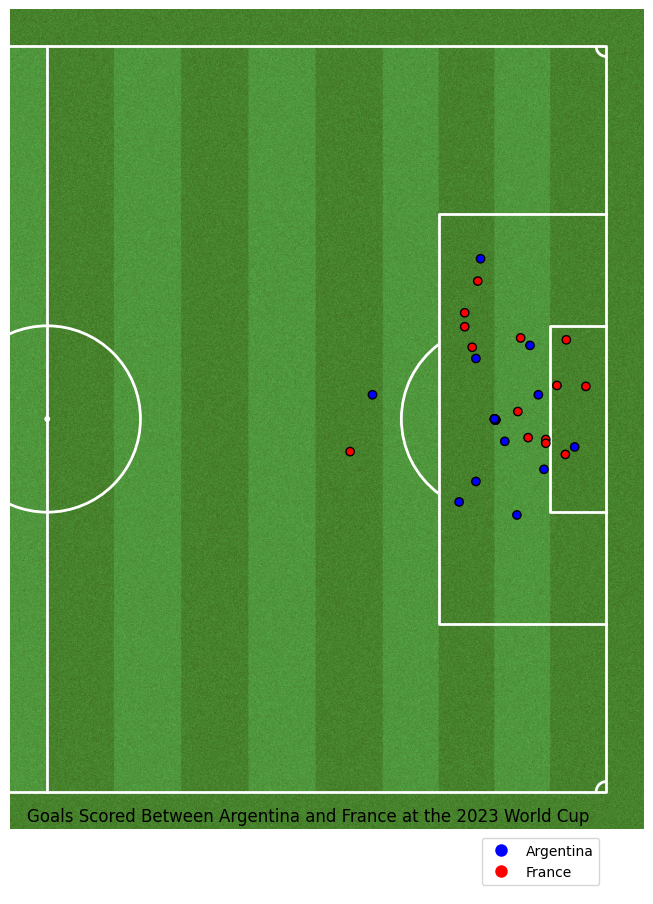

In [2356]:
pitch = Pitch(pitch_type='statsbomb',half = True, goal_type='box', goal_alpha=0.01,pitch_color='grass', line_color='white'
              ,stripe = True,pitch_length=106,pitch_width=68,corner_arcs=True)
fig, axs = pitch.grid(figheight=10, title_height=0, endnote_space=0, axis=False,title_space=0, grid_height=0.82)

#fig.set_facecolor()
team_colors = {
    'Argentina': 'blue',
    'France': 'red',
    # Add more teams and their corresponding colors
}
team_labels = ['Argentina', 'France']  # Add more team labels if needed

# Create a legend with team labels and corresponding colors
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=color) for label, color in zip(team_labels, team_colors.values())]


# Map team names to colors
goals_final['color'] = goals_final['team'].map(team_colors)
#plotting
scatter_shots = pitch.scatter(goals_final['X'], goals_final['Y'], c = goals_final['color'],edgecolors='black', marker='o', ax=axs['pitch'])
# Add the legend to the plot
plt.title('Goals Scored Between Argentina and France at the 2023 World Cup',loc = 'center')
plt.legend(handles=legend_elements, loc='right')
plt.show()

In [2357]:
def extract_events(match_id, target_teams):
    df = sb.events(match_id=match_id)
    # Filter events based on target teams
    #team_events = df[df['team'].isin(target_teams)]
    team_events = df
    event_data = team_events[['match_id','location','pass_end_location','team','player','pass_recipient','timestamp','period']].dropna()
    
    return event_data

all_events = pd.DataFrame()

target_teams = ['France', 'Argentina']
events_list = []
for match_id in matches_df['match_id']:
    event_data = extract_events(match_id, target_teams)
    events_list.append(event_data)

all_events = pd.concat(events_list, ignore_index=True)
all_events.head()

,match_id,location,pass_end_location,team,player,pass_recipient,timestamp,period
0,3869151,"[61.0, 40.1]","[36.1, 48.3]",Australia,Jackson Irvine,Kye Rowles,00:00:00.485,1
1,3869151,"[42.6, 46.8]","[85.7, 76.4]",Australia,Kye Rowles,Mathew Leckie,00:00:04.720,1
2,3869151,"[86.8, 76.7]","[98.1, 71.0]",Australia,Mathew Leckie,Mitchell Thomas Duke,00:00:07.941,1
3,3869151,"[96.4, 78.3]","[88.7, 78.0]",Australia,Mitchell Thomas Duke,Mathew Leckie,00:00:10.246,1
4,3869151,"[87.3, 78.0]","[100.0, 69.9]",Australia,Mathew Leckie,Jackson Irvine,00:00:10.856,1


In [2358]:
df = sb.events(match_id = 3869151)
   
df.columns

Index(['ball_receipt_outcome', 'ball_recovery_recovery_failure',
       'block_deflection', 'carry_end_location', 'clearance_aerial_won',
       'clearance_body_part', 'clearance_head', 'clearance_left_foot',
       'clearance_right_foot', 'counterpress', 'dribble_nutmeg',
       'dribble_outcome', 'dribble_overrun', 'duel_outcome', 'duel_type',
       'duration', 'foul_committed_advantage', 'foul_committed_card',
       'foul_committed_offensive', 'foul_committed_type', 'foul_won_advantage',
       'foul_won_defensive', 'goalkeeper_body_part', 'goalkeeper_end_location',
       'goalkeeper_outcome', 'goalkeeper_position', 'goalkeeper_technique',
       'goalkeeper_type', 'id', 'index', 'injury_stoppage_in_chain',
       'interception_outcome', 'location', 'match_id', 'minute',
       'miscontrol_aerial_won', 'off_camera', 'out', 'pass_aerial_won',
       'pass_angle', 'pass_assisted_shot_id', 'pass_body_part', 'pass_cross',
       'pass_deflected', 'pass_end_location', 'pass_goal_assis

In [2359]:
all_events['timestamp'] = pd.to_datetime(all_events['timestamp'])

all_events['minute'] = (all_events['period']-1) * 45 + all_events['timestamp'].dt.minute

all_events.loc[all_events['period']> 2, 'minute'] = 90 + (all_events['period'] - 3) * 15 + all_events['timestamp'].dt.minute

all_events['X_pass_start'] = all_events['location'].apply(lambda x: x[0])
all_events['Y_pass_start'] = all_events['location'].apply(lambda x: x[1])
#all_events = all_events.drop('location', axis = 1)

all_events['X_pass_end'] = all_events['pass_end_location'].apply(lambda x: x[0])
all_events['Y_pass_end'] = all_events['pass_end_location'].apply(lambda x: x[1])

all_events.head()

,match_id,location,pass_end_location,team,player,pass_recipient,timestamp,period,minute,X_pass_start,Y_pass_start,X_pass_end,Y_pass_end
0,3869151,"[61.0, 40.1]","[36.1, 48.3]",Australia,Jackson Irvine,Kye Rowles,2023-12-16 00:00:00.485,1,0,61.0,40.1,36.1,48.3
1,3869151,"[42.6, 46.8]","[85.7, 76.4]",Australia,Kye Rowles,Mathew Leckie,2023-12-16 00:00:04.720,1,0,42.6,46.8,85.7,76.4
2,3869151,"[86.8, 76.7]","[98.1, 71.0]",Australia,Mathew Leckie,Mitchell Thomas Duke,2023-12-16 00:00:07.941,1,0,86.8,76.7,98.1,71.0
3,3869151,"[96.4, 78.3]","[88.7, 78.0]",Australia,Mitchell Thomas Duke,Mathew Leckie,2023-12-16 00:00:10.246,1,0,96.4,78.3,88.7,78.0
4,3869151,"[87.3, 78.0]","[100.0, 69.9]",Australia,Mathew Leckie,Jackson Irvine,2023-12-16 00:00:10.856,1,0,87.3,78.0,100.0,69.9


In [2360]:
all_events = all_events.drop(['pass_end_location','location'],axis = 1)

In [2361]:
passes_final = pd.merge(matches_df,all_events, on = 'match_id', how = 'inner')
passes_final.head()

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,period,minute,X_pass_start,Y_pass_start,X_pass_end,Y_pass_end
0,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Jackson Irvine,Kye Rowles,2023-12-16 00:00:00.485,1,0,61.0,40.1,36.1,48.3
1,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Kye Rowles,Mathew Leckie,2023-12-16 00:00:04.720,1,0,42.6,46.8,85.7,76.4
2,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Mathew Leckie,Mitchell Thomas Duke,2023-12-16 00:00:07.941,1,0,86.8,76.7,98.1,71.0
3,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Mitchell Thomas Duke,Mathew Leckie,2023-12-16 00:00:10.246,1,0,96.4,78.3,88.7,78.0
4,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Mathew Leckie,Jackson Irvine,2023-12-16 00:00:10.856,1,0,87.3,78.0,100.0,69.9


In [2362]:
len(passes_final)

13442

In [2363]:
passes_final.to_csv('all_passes.csv',index = False)

In [2364]:
merged_df = pd.concat([passes_final,goals_final])

In [2365]:
merged_df

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,X_pass_start,Y_pass_start,X_pass_end,Y_pass_end,shot_outcome,player_id,type,X,Y,color
0,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Jackson Irvine,Kye Rowles,2023-12-16 00:00:00.485,...,61.0,40.1,36.1,48.3,NaN,NaN,NaN,NaN,NaN,NaN
1,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Kye Rowles,Mathew Leckie,2023-12-16 00:00:04.720,...,42.6,46.8,85.7,76.4,NaN,NaN,NaN,NaN,NaN,NaN
2,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Mathew Leckie,Mitchell Thomas Duke,2023-12-16 00:00:07.941,...,86.8,76.7,98.1,71.0,NaN,NaN,NaN,NaN,NaN,NaN
3,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Mitchell Thomas Duke,Mathew Leckie,2023-12-16 00:00:10.246,...,96.4,78.3,88.7,78.0,NaN,NaN,NaN,NaN,NaN,NaN
4,3869151,2022-12-03,Argentina,Australia,2,1,Australia,Mathew Leckie,Jackson Irvine,2023-12-16 00:00:10.856,...,87.3,78.0,100.0,69.9,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,3869152,2022-12-04,France,Poland,3,1,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:45:05.776,...,NaN,NaN,NaN,NaN,Goal,3009.0,Shot,106.2,25.2,red
37,3857279,2022-11-22,France,Australia,4,1,France,Adrien Rabiot,NaN,2023-12-16 00:26:02.241,...,NaN,NaN,NaN,NaN,Goal,3026.0,Shot,111.6,42.0,red
38,3857279,2022-11-22,France,Australia,4,1,France,Olivier Giroud,NaN,2023-12-16 00:31:18.386,...,NaN,NaN,NaN,NaN,Goal,3604.0,Shot,110.5,39.2,red
39,3857279,2022-11-22,France,Australia,4,1,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:22:03.384,...,NaN,NaN,NaN,NaN,Goal,3009.0,Shot,113.5,42.2,red


In [2366]:
len(merged_df)

13483

In [2367]:
merged_df['minute'] = 0

for index,row in merged_df.iterrows():
    if row['period'] == 1:
        merged_df.at[index,'minute'] = row['timestamp'].minute + (row['timestamp'].second / 60) + (row['timestamp'].hour * 60)
    elif row['period'] == 2:
        merged_df.at[index, 'minute'] = 45 + row['timestamp'].minute + (row['timestamp'].second / 60) + (row['timestamp'].hour * 60)
    elif row['period'] == 3:
        merged_df.at[index, 'minute'] = 90 + row['timestamp'].minute + (row['timestamp'].second / 60) + (row['timestamp'].hour * 60)
    elif row['period'] == 4:
        merged_df.at[index, 'minute'] = 105 + row['timestamp'].minute + (row['timestamp'].second / 60) + (row['timestamp'].hour * 60)
    elif row['period']== 5:
        merged_df = merged_df.drop(index)

In [2368]:
merged_df['round_minute'] = merged_df['minute'].apply(lambda x: math.ceil(x))

In [2369]:
merged_df = merged_df.sort_values('minute')
merged_df[['player','away_team','timestamp','minute','round_minute']].head()

,player,away_team,timestamp,minute,round_minute
12535,Ellyes Joris Skhiri,France,2023-12-16 00:00:00.339,0.0,0
2428,Antoine Griezmann,France,2023-12-16 00:00:00.578,0.0,0
1160,Memphis Depay,Argentina,2023-12-16 00:00:00.335,0.0,0
8594,Antoine Griezmann,France,2023-12-16 00:00:00.502,0.0,0
5643,Andrej Kramarić,Croatia,2023-12-16 00:00:00.423,0.0,0


In [2370]:
merged_df['penalty'] = 'No'
merged_df.loc[(merged_df['X']== 108.0) & (merged_df['Y']== 40.0),'penalty'] = 'Yes'

In [2371]:
merged_df[merged_df['X'].notnull()][['home_team','away_team','player','minute','round_minute','X','Y','penalty']]

,home_team,away_team,player,minute,round_minute,X,Y,penalty
32,France,Morocco,Theo Bernard François Hernández,4.666667,5,115.7,31.5,No
27,Argentina,Saudi Arabia,Lionel Andrés Messi Cuccittini,9.250000,10,108.0,40.0,Yes
30,England,France,Aurélien Djani Tchouaméni,16.366667,17,92.5,43.5,No
8,Argentina,France,Lionel Andrés Messi Cuccittini,22.400000,23,108.0,40.0,Yes
37,France,Australia,Adrien Rabiot,26.033333,27,111.6,42.0,No
38,France,Australia,Olivier Giroud,31.300000,32,110.5,39.2,No
24,Argentina,Croatia,Lionel Andrés Messi Cuccittini,33.450000,34,108.0,40.0,Yes
2,Netherlands,Argentina,Nahuel Molina Lucero,34.066667,35,109.1,42.4,No
0,Argentina,Australia,Lionel Andrés Messi Cuccittini,34.583333,35,104.2,48.9,No
9,Argentina,France,Ángel Fabián Di María Hernández,35.366667,36,111.8,32.1,No


In [2372]:
merged_df['pass_recipient'] = merged_df['pass_recipient'].replace('nan','goal')

In [2373]:
merged_df.to_csv('merged_data.csv')

In [2374]:
merged_df = merged_df.sort_values(['match_id','minute','timestamp'])

In [2375]:
merged_df.columns

Index(['match_id', 'match_date', 'home_team', 'away_team', 'home_score',
       'away_score', 'team', 'player', 'pass_recipient', 'timestamp', 'period',
       'minute', 'X_pass_start', 'Y_pass_start', 'X_pass_end', 'Y_pass_end',
       'shot_outcome', 'player_id', 'type', 'X', 'Y', 'color', 'round_minute',
       'penalty'],
      dtype='object')

In [2376]:
merged_df = merged_df.sort_values('timestamp')
merged_df

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,X_pass_end,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty
7538,3857266,2022-11-26,France,Denmark,2,1,Denmark,Andreas Evald Cornelius,Christian Dannemann Eriksen,2023-12-16 00:00:00.129,...,59.5,39.1,NaN,NaN,NaN,NaN,NaN,NaN,0,No
10914,3869152,2022-12-04,France,Poland,3,1,Poland,Piotr Zieliński,Grzegorz Krychowiak,2023-12-16 00:00:00.202,...,46.5,34.4,NaN,NaN,NaN,NaN,NaN,NaN,45,No
3328,3869685,2022-12-18,Argentina,France,3,3,France,Randal Kolo Muani,Aurélien Djani Tchouaméni,2023-12-16 00:00:00.275,...,51.6,43.2,NaN,NaN,NaN,NaN,NaN,NaN,90,No
3542,3857264,2022-11-30,Poland,Argentina,0,2,Poland,Karol Świderski,Jakub Piotr Kiwior,2023-12-16 00:00:00.321,...,37.3,47.5,NaN,NaN,NaN,NaN,NaN,NaN,0,No
1160,3869321,2022-12-09,Netherlands,Argentina,2,2,Netherlands,Memphis Depay,Nathan Aké,2023-12-16 00:00:00.335,...,36.3,34.9,NaN,NaN,NaN,NaN,NaN,NaN,0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7533,3857300,2022-11-22,Argentina,Saudi Arabia,1,2,Argentina,Enzo Fernandez,Ángel Fabián Di María Hernández,2023-12-16 00:58:26.008,...,99.9,68.0,NaN,NaN,NaN,NaN,NaN,NaN,104,No
7534,3857300,2022-11-22,Argentina,Saudi Arabia,1,2,Argentina,Lionel Andrés Messi Cuccittini,Ángel Fabián Di María Hernández,2023-12-16 00:58:33.310,...,97.8,71.0,NaN,NaN,NaN,NaN,NaN,NaN,104,No
7535,3857300,2022-11-22,Argentina,Saudi Arabia,1,2,Argentina,Lisandro Martínez,Damián Emiliano Martínez,2023-12-16 00:58:39.247,...,27.2,44.4,NaN,NaN,NaN,NaN,NaN,NaN,104,No
7536,3857300,2022-11-22,Argentina,Saudi Arabia,1,2,Argentina,Damián Emiliano Martínez,Enzo Fernandez,2023-12-16 00:58:42.410,...,53.7,24.1,NaN,NaN,NaN,NaN,NaN,NaN,104,No


In [2377]:
merged_df.columns

Index(['match_id', 'match_date', 'home_team', 'away_team', 'home_score',
       'away_score', 'team', 'player', 'pass_recipient', 'timestamp', 'period',
       'minute', 'X_pass_start', 'Y_pass_start', 'X_pass_end', 'Y_pass_end',
       'shot_outcome', 'player_id', 'type', 'X', 'Y', 'color', 'round_minute',
       'penalty'],
      dtype='object')

In [2378]:
goal_rows = merged_df[merged_df['type'] == 'Shot']
goal_num = 0

for index, goal_row in goal_rows.iterrows():
    match_id = goal_row['match_id']
    goal_team = goal_row['team']
    goal_minute = goal_row['minute']

    # Find the last touch before the goal
    last_touch_index = merged_df[(merged_df['match_id'] == match_id) & (merged_df['team'] != goal_team) & (merged_df['timestamp'] < goal_row['timestamp'])].index.max()

    if pd.notna(last_touch_index):
        # Get the passes leading up to the goal
        leading_passes = merged_df.loc[(merged_df['match_id'] == match_id) & (merged_df['team'] == goal_team) & (merged_df['timestamp'] <= goal_row['timestamp'])]
        #leading_passes = merged_df.iloc[last_touch_index + 1:index + 1]
        

        # Assign goal numbers
        goal_num += 1
        merged_df.loc[leading_passes.index, 'goal_number'] = goal_num

# Fill NaN values in the 'goal_number' column with 0
merged_df['goal_number'] = merged_df['goal_number'].fillna(0).astype(int)


### Argentina vs Mexico

In [2379]:
game_ArvMX= merged_df[merged_df['match_id'] == 3857289]
game_ArvMX = game_ArvMX.sort_values('minute')
game_ArvMX = game_ArvMX.reset_index(drop = True)
game_ArvMX.head()

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
0,3857289,2022-11-26,Argentina,Mexico,2,0,Mexico,José Andrés Guardado Hernández,Héctor Miguel Herrera López,2023-12-16 00:00:00.547,...,36.5,NaN,NaN,NaN,NaN,NaN,NaN,0,No,0
1,3857289,2022-11-26,Argentina,Mexico,2,0,Mexico,Héctor Miguel Herrera López,Hirving Rodrigo Lozano Bahena,2023-12-16 00:00:03.438,...,57.7,NaN,NaN,NaN,NaN,NaN,NaN,1,No,0
2,3857289,2022-11-26,Argentina,Mexico,2,0,Argentina,Damián Emiliano Martínez,Nicolás Hernán Otamendi,2023-12-16 00:00:15.756,...,49.5,NaN,NaN,NaN,NaN,NaN,NaN,1,No,29
3,3857289,2022-11-26,Argentina,Mexico,2,0,Argentina,Nicolás Hernán Otamendi,Gonzalo Ariel Montiel,2023-12-16 00:00:17.890,...,71.8,NaN,NaN,NaN,NaN,NaN,NaN,1,No,29
4,3857289,2022-11-26,Argentina,Mexico,2,0,Argentina,Gonzalo Ariel Montiel,Nicolás Hernán Otamendi,2023-12-16 00:00:22.955,...,53.9,NaN,NaN,NaN,NaN,NaN,NaN,1,No,29


In [2380]:
game_ArvMX[game_ArvMX['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
671,3857289,2022-11-26,Argentina,Mexico,2,0,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:18:32.183,...,NaN,Goal,5503.0,Shot,94.9,37.4,blue,64,No,29
861,3857289,2022-11-26,Argentina,Mexico,2,0,Argentina,Enzo Fernandez,NaN,2023-12-16 00:41:39.636,...,NaN,Goal,38718.0,Shot,106.5,22.8,blue,87,No,29


In [2381]:
Arg_goal1 = game_ArvMX[664:672]

In [2382]:
Arg_goal2 = game_ArvMX[859:862]

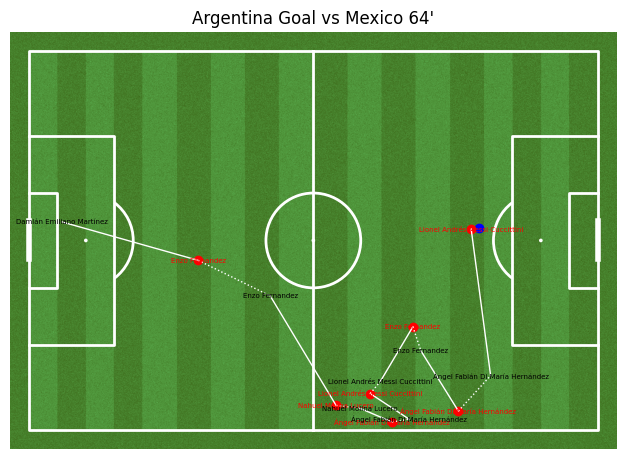

In [2383]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal1.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal1['X'], Arg_goal1['Y'], c='blue', marker='o', label='Pass Start')
ax.scatter(Arg_goal1['X_pass_end'], Arg_goal1['Y_pass_end'], c='red', marker='o', label='Pass End')

for i in range(len(Arg_goal1) - 1):
    x_start = Arg_goal1.iloc[i]['X_pass_end']
    y_start = Arg_goal1.iloc[i]['Y_pass_end']
    x_end = Arg_goal1.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal1.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)

ax.set_title("Argentina Goal vs Mexico 64'" )


# Show the plot
plt.show()

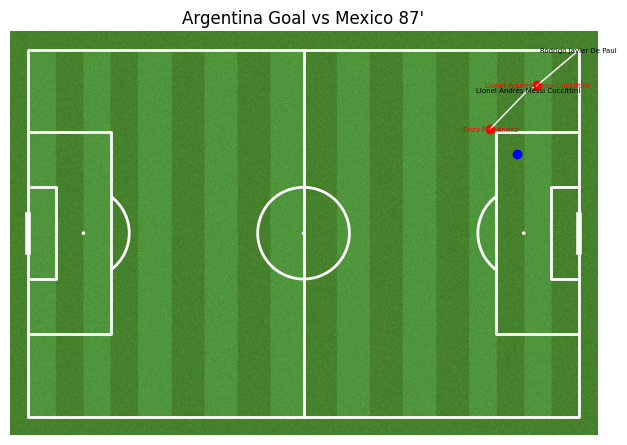

In [2384]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal2.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal2['X'], Arg_goal2['Y'], c='blue', marker='o', label='Pass Start')
ax.scatter(Arg_goal2['X_pass_end'], Arg_goal2['Y_pass_end'], c='red', marker='o', label='Pass End')

for i in range(len(Arg_goal2) - 1):
    x_start = Arg_goal2.iloc[i]['X_pass_end']
    y_start = Arg_goal2.iloc[i]['Y_pass_end']
    x_end = Arg_goal2.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal2.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)

ax.set_title("Argentina Goal vs Mexico 87'" )


# Show the plot
plt.show()

### Argentina vs Poland


In [2385]:
game_ArvPo= merged_df[merged_df['match_id'] == 3857264]
game_ArvPo = game_ArvPo.sort_values('minute')
game_ArvPo = game_ArvPo.reset_index(drop = True)

game_ArvPo[game_ArvPo['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
476,3857264,2022-11-30,Poland,Argentina,0,2,Argentina,Alexis Mac Allister,NaN,2023-12-16 00:00:53.623,...,NaN,Goal,27886.0,Shot,106.0,46.7,blue,46,No,24
751,3857264,2022-11-30,Poland,Argentina,0,2,Argentina,Julián Álvarez,NaN,2023-12-16 00:21:57.855,...,NaN,Goal,29560.0,Shot,106.0,33.5,blue,67,No,24


In [2386]:
Arg_goal3 = game_ArvPo[468:477]
Arg_goal4 = game_ArvPo[725:752]


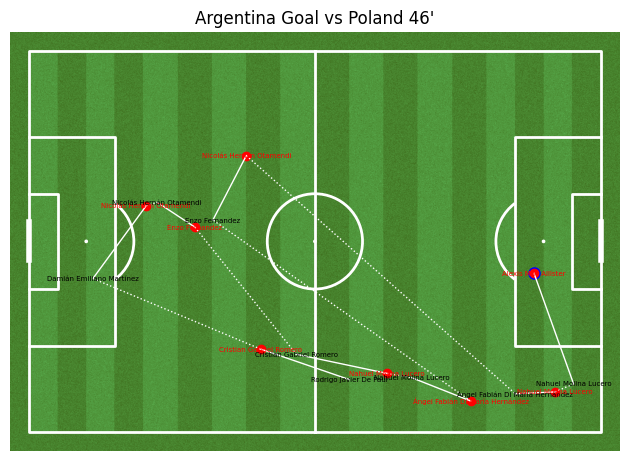

In [2387]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal3.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points

ax.scatter(Arg_goal3['X'], Arg_goal3['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal3['X_pass_end'], Arg_goal3['Y_pass_end'], c='red', marker='o', label='Pass End')

for i in range(len(Arg_goal3) - 1):
    x_start = Arg_goal3.iloc[i]['X_pass_end']
    y_start = Arg_goal3.iloc[i]['Y_pass_end']
    x_end = Arg_goal3.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal3.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)

ax.set_title("Argentina Goal vs Poland 46'" )


# Show the plot
plt.show()

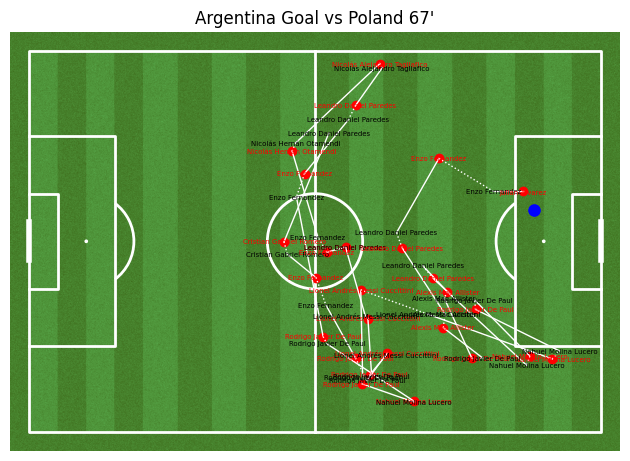

In [2388]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal4.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal4['X'], Arg_goal4['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal4['X_pass_end'], Arg_goal4['Y_pass_end'], c='red', marker='o', label='Pass End')

for i in range(len(Arg_goal4) - 1):
    x_start = Arg_goal4.iloc[i]['X_pass_end']
    y_start = Arg_goal4.iloc[i]['Y_pass_end']
    x_end = Arg_goal4.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal4.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)

ax.set_title("Argentina Goal vs Poland 67'" )


# Show the plot
plt.show()

### Argentina vs Australia

In [2389]:
game_ArvAu= merged_df[merged_df['match_id'] == 3869151]
game_ArvAu = game_ArvAu.sort_values('minute')
game_ArvAu = game_ArvAu.reset_index(drop = True)

game_ArvAu[game_ArvAu['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
454,3869151,2022-12-03,Argentina,Australia,2,1,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:34:35.083,...,NaN,Goal,5503.0,Shot,104.2,48.9,blue,35,No,24
772,3869151,2022-12-03,Argentina,Australia,2,1,Argentina,Julián Álvarez,NaN,2023-12-16 00:11:41.079,...,NaN,Goal,29560.0,Shot,110.4,50.3,blue,57,No,24


In [2390]:
Arg_goal5 = game_ArvAu[449:455]
Arg_goal6 = game_ArvAu[772:773]

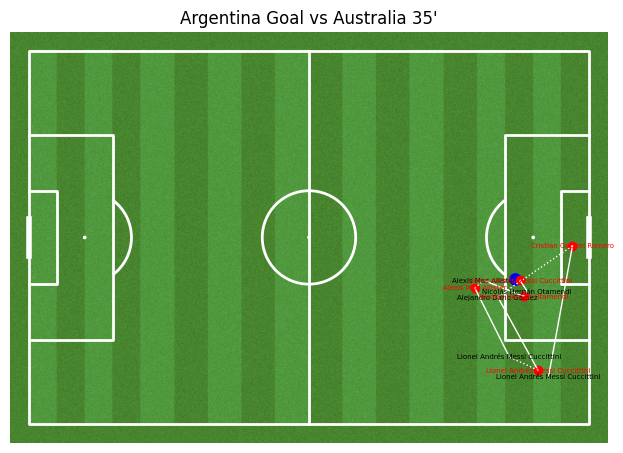

In [2391]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal5.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal5['X'], Arg_goal5['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal5['X_pass_end'], Arg_goal5['Y_pass_end'], c='red', marker='o', label='Pass End')

for i in range(len(Arg_goal5) - 1):
    x_start = Arg_goal5.iloc[i]['X_pass_end']
    y_start = Arg_goal5.iloc[i]['Y_pass_end']
    x_end = Arg_goal5.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal5.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)

ax.set_title("Argentina Goal vs Australia 35'" )


# Show the plot
plt.show()

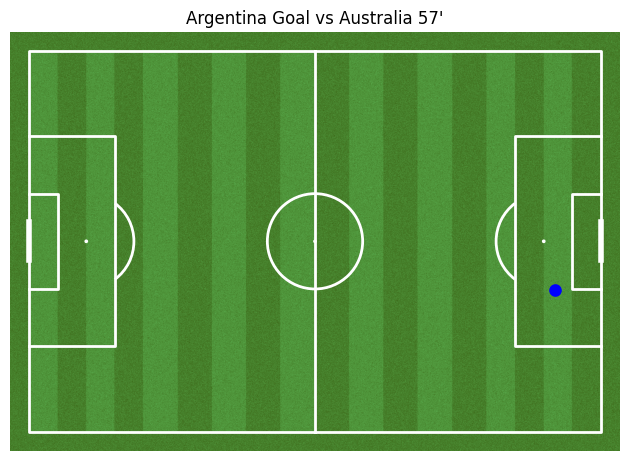

In [2392]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal6.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal6['X'], Arg_goal6['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal6['X_pass_end'], Arg_goal6['Y_pass_end'], c='red', marker='o', label='Pass End')

for i in range(len(Arg_goal6) - 1):
    x_start = Arg_goal6.iloc[i]['X_pass_end']
    y_start = Arg_goal6.iloc[i]['Y_pass_end']
    x_end = Arg_goal6.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal6.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)


ax.set_title("Argentina Goal vs Australia 57'" )


# Show the plot
plt.show()

### Argentina vs Netherlands

In [2393]:
game_ArvNd= merged_df[merged_df['match_id'] == 3869321]
game_ArvNd = game_ArvNd.sort_values('minute')
game_ArvNd = game_ArvNd.reset_index(drop = True)

game_ArvNd[game_ArvNd['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
430,3869321,2022-12-09,Netherlands,Argentina,2,2,Argentina,Nahuel Molina Lucero,NaN,2023-12-16 00:34:04.090,...,NaN,Goal,29201.0,Shot,109.1,42.4,blue,35,No,22
846,3869321,2022-12-09,Netherlands,Argentina,2,2,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:27:39.369,...,NaN,Goal,5503.0,Shot,108.0,40.0,blue,73,Yes,22


In [2394]:
Arg_goal7 = game_ArvNd[427:431]

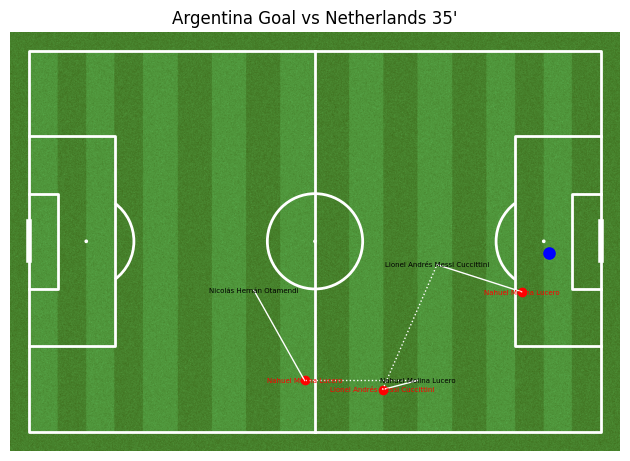

In [2395]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal7.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal7['X'], Arg_goal7['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal7['X_pass_end'], Arg_goal7['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Arg_goal7) - 1):
    x_start = Arg_goal7.iloc[i]['X_pass_end']
    y_start = Arg_goal7.iloc[i]['Y_pass_end']
    x_end = Arg_goal7.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal7.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)

ax.set_title("Argentina Goal vs Netherlands 35'" )


# Show the plot
plt.show()


### Argentina vs Croatia

In [2396]:
game_ArvCr= merged_df[merged_df['match_id'] == 3869519]
game_ArvCr = game_ArvCr.sort_values('minute')
game_ArvCr = game_ArvCr.reset_index(drop = True)

game_ArvCr[game_ArvCr['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
405,3869519,2022-12-13,Argentina,Croatia,3,0,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:33:27.067,...,NaN,Goal,5503.0,Shot,108.0,40.0,blue,34,Yes,27
454,3869519,2022-12-13,Argentina,Croatia,3,0,Argentina,Julián Álvarez,NaN,2023-12-16 00:38:26.300,...,NaN,Goal,29560.0,Shot,112.7,37.4,blue,39,No,27
801,3869519,2022-12-13,Argentina,Croatia,3,0,Argentina,Julián Álvarez,NaN,2023-12-16 00:23:46.955,...,NaN,Goal,29560.0,Shot,113.3,45.4,blue,69,No,27


In [2397]:
Arg_goal8 = game_ArvCr[453:455]
Arg_goal9 = game_ArvCr[797:802]

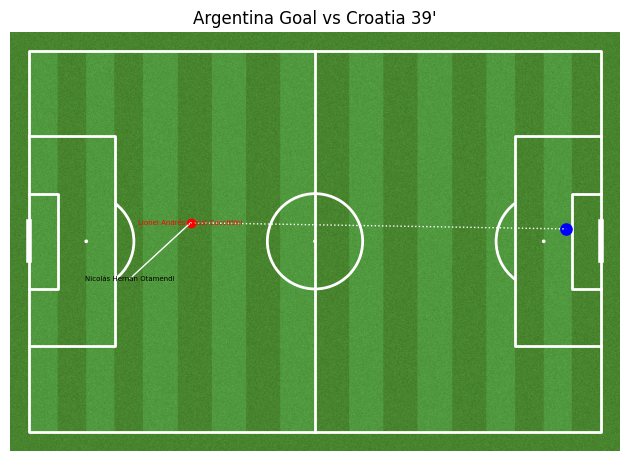

In [2398]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal8.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal8['X'], Arg_goal8['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal8['X_pass_end'], Arg_goal8['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Arg_goal8) - 1):
    x_start = Arg_goal8.iloc[i]['X_pass_end']
    y_start = Arg_goal8.iloc[i]['Y_pass_end']
    x_end = Arg_goal8.iloc[i + 1]['X']
    y_end = Arg_goal8.iloc[i + 1]['Y']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)

ax.set_title("Argentina Goal vs Croatia 39'" )


# Show the plot
plt.show()

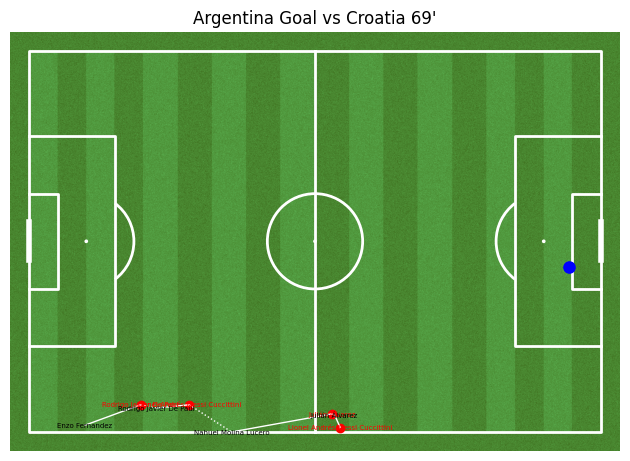

In [2399]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal9.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal9['X'], Arg_goal9['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal9['X_pass_end'], Arg_goal9['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Arg_goal9) - 1):
    x_start = Arg_goal9.iloc[i]['X_pass_end']
    y_start = Arg_goal9.iloc[i]['Y_pass_end']
    x_end = Arg_goal9.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal9.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("Argentina Goal vs Croatia 69'" )

# Show the plot
plt.show()

### Argentina vs France

In [2400]:
game_ArvFr= merged_df[merged_df['match_id'] == 3869685]
game_ArvFr = game_ArvFr.sort_values('minute')
game_ArvFr = game_ArvFr.reset_index(drop = True)

game_ArvFr[game_ArvFr['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
211,3869685,2022-12-18,Argentina,France,3,3,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:22:24.114,...,NaN,Goal,5503.0,Shot,108.0,40.0,blue,23,Yes,25
327,3869685,2022-12-18,Argentina,France,3,3,Argentina,Ángel Fabián Di María Hernández,NaN,2023-12-16 00:35:22.647,...,NaN,Goal,2995.0,Shot,111.8,32.1,blue,36,No,25
777,3869685,2022-12-18,Argentina,France,3,3,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:34:24.975,...,NaN,Goal,3009.0,Shot,108.0,40.0,red,80,Yes,26
796,3869685,2022-12-18,Argentina,France,3,3,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:35:59.025,...,NaN,Goal,3009.0,Shot,104.8,30.1,red,81,No,26
1059,3869685,2022-12-18,Argentina,France,3,3,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:02:58.079,...,NaN,Goal,5503.0,Shot,116.6,43.0,blue,108,No,25
1084,3869685,2022-12-18,Argentina,France,3,3,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:12:05.189,...,NaN,Goal,3009.0,Shot,108.0,40.0,red,118,Yes,26


In [2401]:
Arg_goal10 = game_ArvFr[321:328]
Arg_goal11 = game_ArvFr[1054:1060]

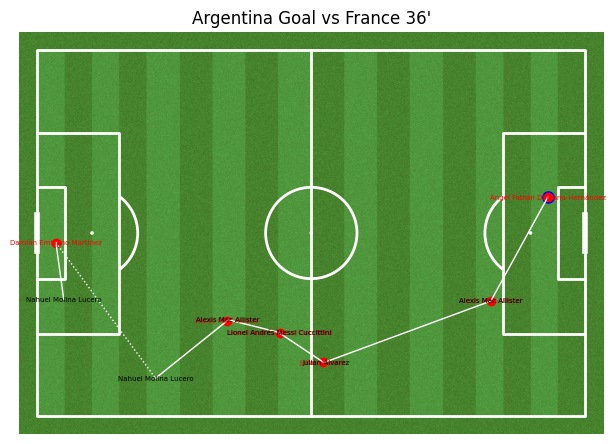

In [2402]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal10.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal10['X'], Arg_goal10['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal10['X_pass_end'], Arg_goal10['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Arg_goal10) - 1):
    x_start = Arg_goal10.iloc[i]['X_pass_end']
    y_start = Arg_goal10.iloc[i]['Y_pass_end']
    x_end = Arg_goal10.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal10.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("Argentina Goal vs France 36'" )

# Show the plot
plt.show()

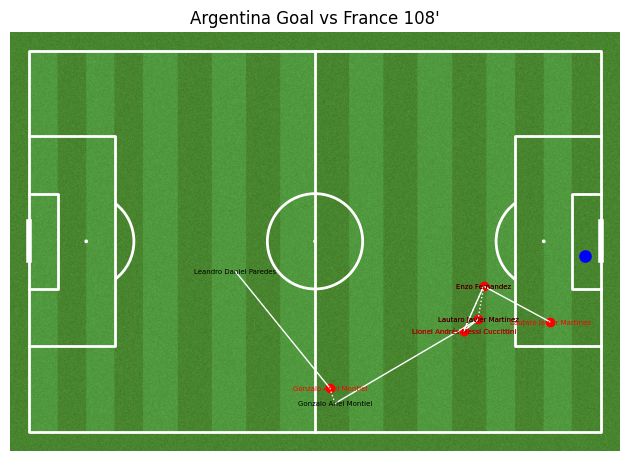

In [2403]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Arg_goal11.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Arg_goal11['X'], Arg_goal11['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Arg_goal11['X_pass_end'], Arg_goal11['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Arg_goal11) - 1):
    x_start = Arg_goal11.iloc[i]['X_pass_end']
    y_start = Arg_goal11.iloc[i]['Y_pass_end']
    x_end = Arg_goal11.iloc[i + 1]['X_pass_start']
    y_end = Arg_goal11.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("Argentina Goal vs France 108'" )

# Show the plot
plt.show()

### France vs Australia

In [2404]:
game_FRvAu= merged_df[merged_df['match_id'] == 3857279]
game_FRvAu = game_FRvAu.sort_values('minute')
game_FRvAu = game_FRvAu.reset_index(drop = True)

game_ArvFr[game_FRvAu['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
264,3869685,2022-12-18,Argentina,France,3,3,Argentina,Lionel Andrés Messi Cuccittini,Ángel Fabián Di María Hernández,2023-12-16 00:31:14.664,...,7.4,NaN,NaN,NaN,NaN,NaN,NaN,32,No,25
310,3869685,2022-12-18,Argentina,France,3,3,Argentina,Nicolás Alejandro Tagliafico,Enzo Fernandez,2023-12-16 00:34:25.657,...,12.3,NaN,NaN,NaN,NaN,NaN,NaN,35,No,25
810,3869685,2022-12-18,Argentina,France,3,3,Argentina,Julián Álvarez,Marcos Javier Acuña,2023-12-16 00:38:14.831,...,11.7,NaN,NaN,NaN,NaN,NaN,NaN,84,No,0
840,3869685,2022-12-18,Argentina,France,3,3,Argentina,Rodrigo Javier De Paul,Lionel Andrés Messi Cuccittini,2023-12-16 00:44:47.973,...,66.7,NaN,NaN,NaN,NaN,NaN,NaN,90,No,0


In [2405]:
Fr_goal1 = game_FRvAu[245:265]
Fr_goal2 = game_FRvAu[308:311]
Fr_goal3 = game_FRvAu[765:811]
Fr_goal4 = game_FRvAu[832:841]

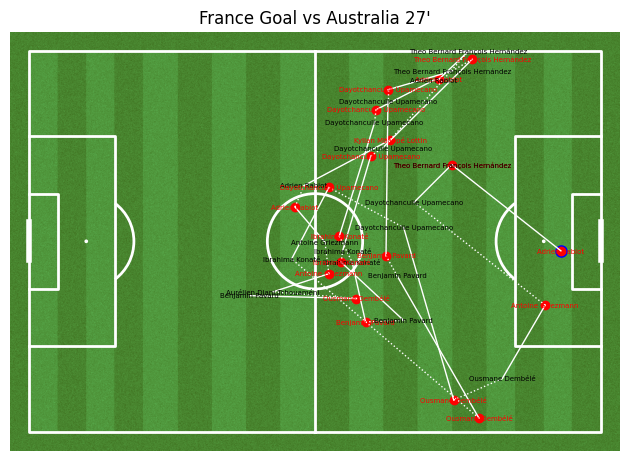

In [2406]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal1.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal1['X'], Fr_goal1['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal1['X_pass_end'], Fr_goal1['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal1) - 1):
    x_start = Fr_goal1.iloc[i]['X_pass_end']
    y_start = Fr_goal1.iloc[i]['Y_pass_end']
    x_end = Fr_goal1.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal1.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Australia 27'" )

# Show the plot
plt.show()

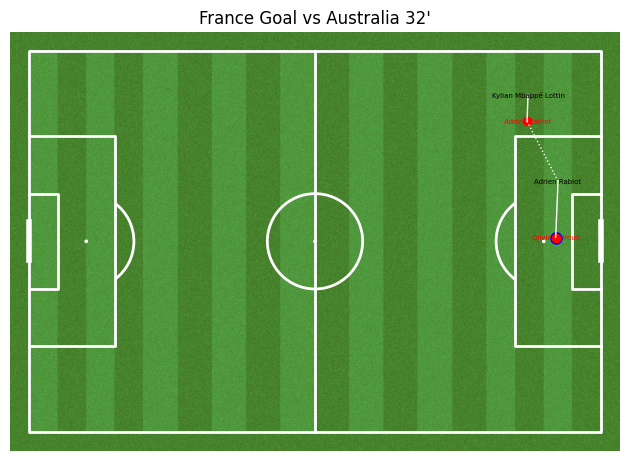

In [2407]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal2.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal2['X'], Fr_goal2['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal2['X_pass_end'], Fr_goal2['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal2) - 1):
    x_start = Fr_goal2.iloc[i]['X_pass_end']
    y_start = Fr_goal2.iloc[i]['Y_pass_end']
    x_end = Fr_goal2.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal2.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Australia 32'" )

# Show the plot
plt.show()

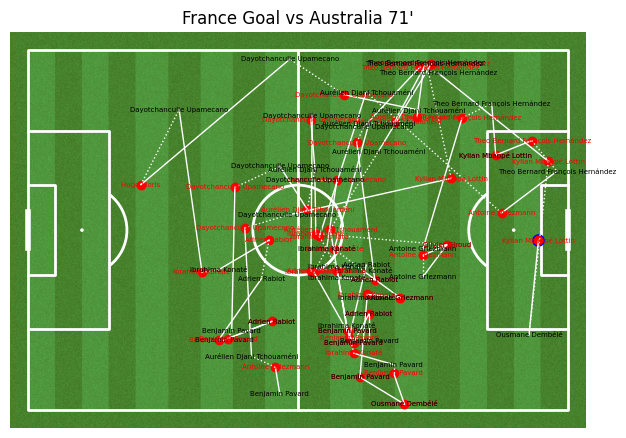

In [2408]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal3.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal3['X'], Fr_goal3['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal3['X_pass_end'], Fr_goal3['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal3) - 1):
    x_start = Fr_goal3.iloc[i]['X_pass_end']
    y_start = Fr_goal3.iloc[i]['Y_pass_end']
    x_end = Fr_goal3.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal3.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Australia 71'" )

# Show the plot
plt.show()

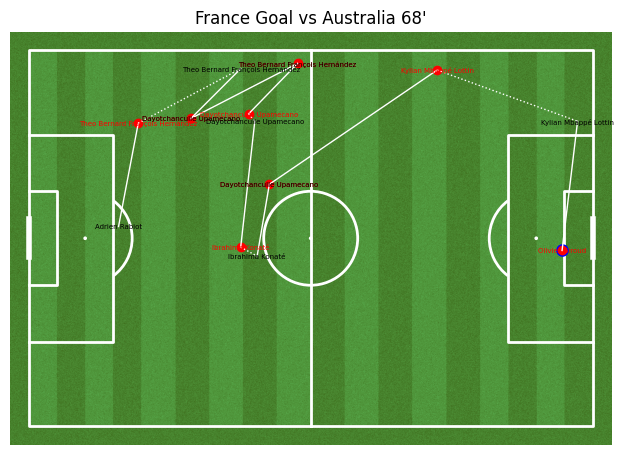

In [2409]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal4.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal4['X'], Fr_goal4['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal4['X_pass_end'], Fr_goal4['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal4) - 1):
    x_start = Fr_goal4.iloc[i]['X_pass_end']
    y_start = Fr_goal4.iloc[i]['Y_pass_end']
    x_end = Fr_goal4.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal4.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Australia 68'" )

# Show the plot
plt.show()

### France vs Denmark

In [2410]:
game_FRvDen= merged_df[merged_df['match_id'] == 3857266]
game_FRvDen = game_FRvDen.sort_values('minute')
game_FRvDen = game_FRvDen.reset_index(drop = True)

game_FRvDen[game_FRvDen['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
704,3857266,2022-11-26,France,Denmark,2,1,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:15:25.039,...,NaN,Goal,3009.0,Shot,110.8,31.3,red,61,No,28
917,3857266,2022-11-26,France,Denmark,2,1,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:40:09.953,...,NaN,Goal,3009.0,Shot,117.8,36.5,red,86,No,28


In [2411]:
Fr_goal5 = game_FRvDen[700:705]
Fr_goal6 = game_FRvDen[908:918]

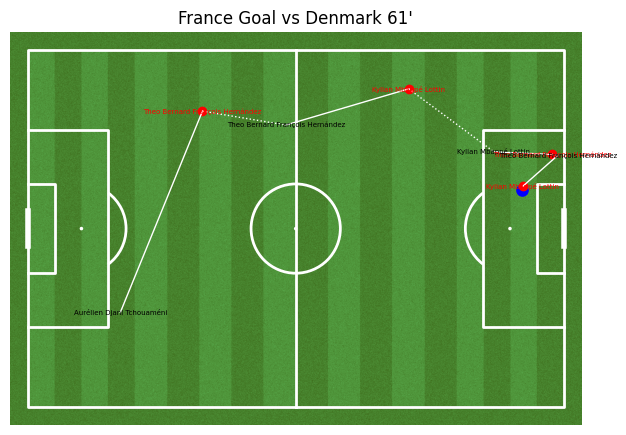

In [2412]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal5.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal5['X'], Fr_goal5['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal5['X_pass_end'], Fr_goal5['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal5) - 1):
    x_start = Fr_goal5.iloc[i]['X_pass_end']
    y_start = Fr_goal5.iloc[i]['Y_pass_end']
    x_end = Fr_goal5.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal5.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Denmark 61'" )

# Show the plot
plt.show()

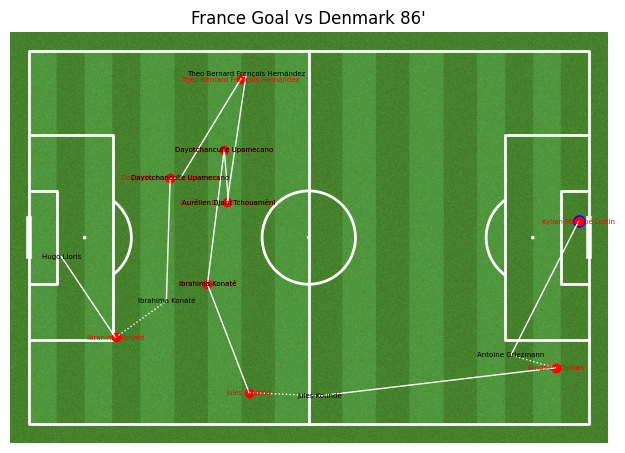

In [2413]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal6.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal6['X'], Fr_goal6['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal6['X_pass_end'], Fr_goal6['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal6) - 1):
    x_start = Fr_goal6.iloc[i]['X_pass_end']
    y_start = Fr_goal6.iloc[i]['Y_pass_end']
    x_end = Fr_goal6.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal6.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Denmark 86'" )

# Show the plot
plt.show()

### France vs Poland

In [2414]:
game_FRvPo= merged_df[merged_df['match_id'] == 3869152]
game_FRvPo = game_FRvPo.sort_values('minute')
game_FRvPo = game_FRvPo.reset_index(drop = True)

game_FRvPo[game_FRvPo['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
468,3869152,2022-12-04,France,Poland,3,1,France,Olivier Giroud,NaN,2023-12-16 00:43:28.199,...,NaN,Goal,3604.0,Shot,105.6,32.3,red,44,No,31
791,3869152,2022-12-04,France,Poland,3,1,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:28:56.875,...,NaN,Goal,3009.0,Shot,104.8,28.6,red,74,No,31
953,3869152,2022-12-04,France,Poland,3,1,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:45:05.776,...,NaN,Goal,3009.0,Shot,106.2,25.2,red,91,No,31


In [2415]:
Fr_goal7 = game_FRvPo[440:469]
Fr_goal8 = game_FRvPo[787:792]
Fr_goal9 = game_FRvPo[945:954]

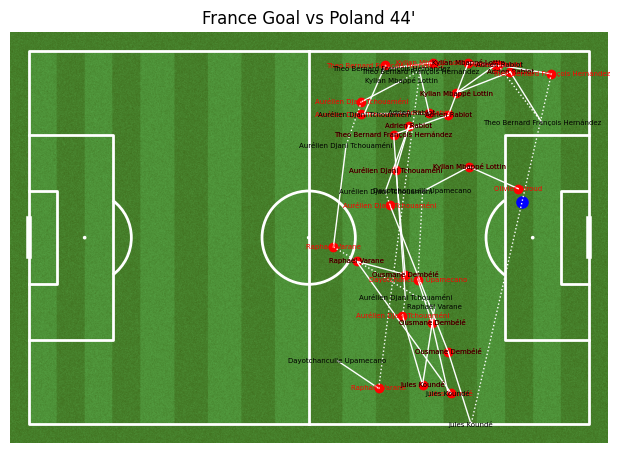

In [2416]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal7.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal7['X'], Fr_goal7['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal7['X_pass_end'], Fr_goal7['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal7) - 1):
    x_start = Fr_goal7.iloc[i]['X_pass_end']
    y_start = Fr_goal7.iloc[i]['Y_pass_end']
    x_end = Fr_goal7.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal7.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Poland 44'" )

# Show the plot
plt.show()

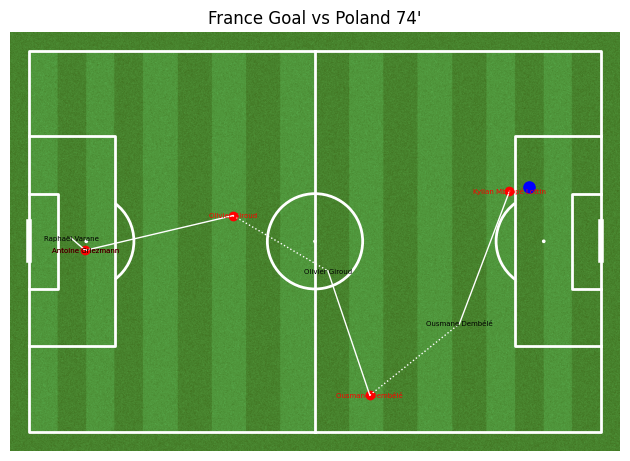

In [2417]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal8.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal8['X'], Fr_goal8['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal8['X_pass_end'], Fr_goal8['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal8) - 1):
    x_start = Fr_goal8.iloc[i]['X_pass_end']
    y_start = Fr_goal8.iloc[i]['Y_pass_end']
    x_end = Fr_goal8.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal8.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Poland 74'" )

# Show the plot
plt.show()

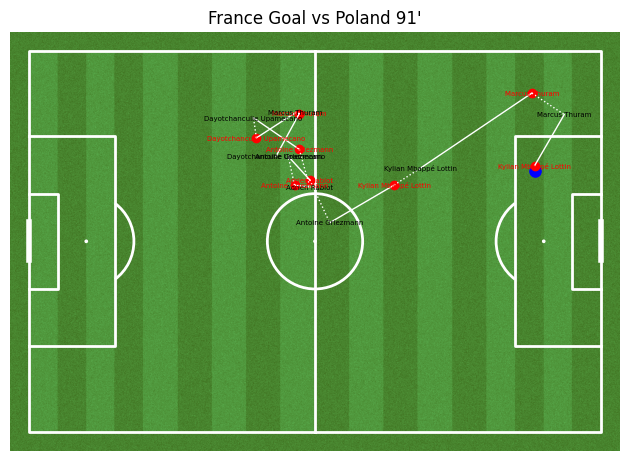

In [2418]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal9.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal9['X'], Fr_goal9['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal9['X_pass_end'], Fr_goal9['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal9) - 1):
    x_start = Fr_goal9.iloc[i]['X_pass_end']
    y_start = Fr_goal9.iloc[i]['Y_pass_end']
    x_end = Fr_goal9.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal9.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Poland 91'" )

# Show the plot
plt.show()

### France vs England

In [2419]:
game_FRvEn= merged_df[merged_df['match_id'] == 3869354]
game_FRvEn = game_FRvEn.sort_values('minute')
game_FRvEn = game_FRvEn.reset_index(drop = True)

game_FRvEn[game_FRvEn['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
188,3869354,2022-12-10,England,France,1,2,France,Aurélien Djani Tchouaméni,NaN,2023-12-16 00:16:22.902,...,NaN,Goal,10481.0,Shot,92.5,43.5,red,17,No,24
823,3869354,2022-12-10,England,France,1,2,France,Olivier Giroud,NaN,2023-12-16 00:32:10.083,...,NaN,Goal,3604.0,Shot,114.7,36.4,red,78,No,24


In [2420]:
Fr_goal10 = game_FRvEn[182:189]
Fr_goal11 = game_FRvEn[809:824]


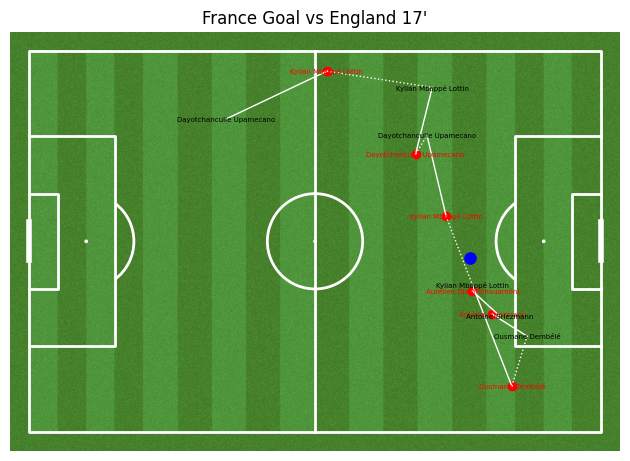

In [2421]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal10.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal10['X'], Fr_goal10['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal10['X_pass_end'], Fr_goal10['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal10) - 1):
    x_start = Fr_goal10.iloc[i]['X_pass_end']
    y_start = Fr_goal10.iloc[i]['Y_pass_end']
    x_end = Fr_goal10.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal10.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs England 17'" )

# Show the plot
plt.show()

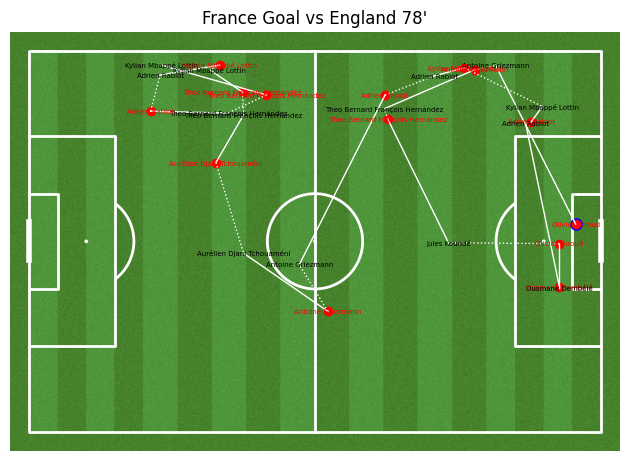

In [2422]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal11.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal11['X'], Fr_goal11['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal11['X_pass_end'], Fr_goal11['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal11) - 1):
    x_start = Fr_goal11.iloc[i]['X_pass_end']
    y_start = Fr_goal11.iloc[i]['Y_pass_end']
    x_end = Fr_goal11.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal11.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs England 78'" )

# Show the plot
plt.show()

### France vs Morocco

In [2423]:
game_FRvMo= merged_df[merged_df['match_id'] == 3869552]
game_FRvMo = game_FRvMo.sort_values('minute')
game_FRvMo = game_FRvMo.reset_index(drop = True)

game_FRvMo[game_FRvMo['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
62,3869552,2022-12-14,France,Morocco,2,0,France,Theo Bernard François Hernández,NaN,2023-12-16 00:04:40.089,...,NaN,Goal,6704.0,Shot,115.7,31.5,red,5,No,24
800,3869552,2022-12-14,France,Morocco,2,0,France,Randal Kolo Muani,NaN,2023-12-16 00:33:49.922,...,NaN,Goal,22097.0,Shot,115.6,43.8,red,79,No,24


In [2424]:
Fr_goal12 = game_FRvMo[46:63]
Fr_goal13 = game_FRvMo[796:801]

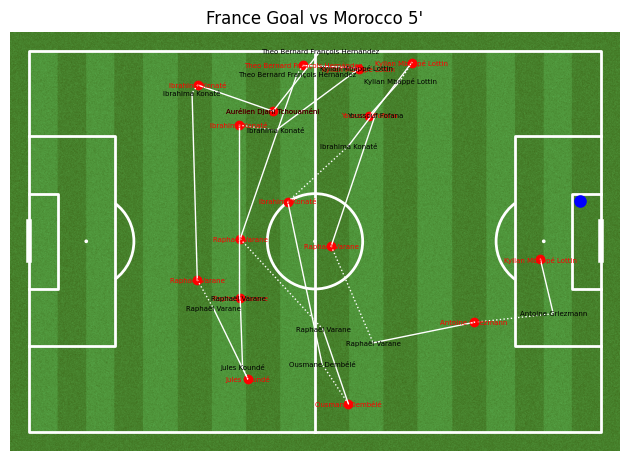

In [2425]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal12.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal12['X'], Fr_goal12['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal12['X_pass_end'], Fr_goal12['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal12) - 1):
    x_start = Fr_goal12.iloc[i]['X_pass_end']
    y_start = Fr_goal12.iloc[i]['Y_pass_end']
    x_end = Fr_goal12.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal12.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Morocco 5'" )

# Show the plot
plt.show()

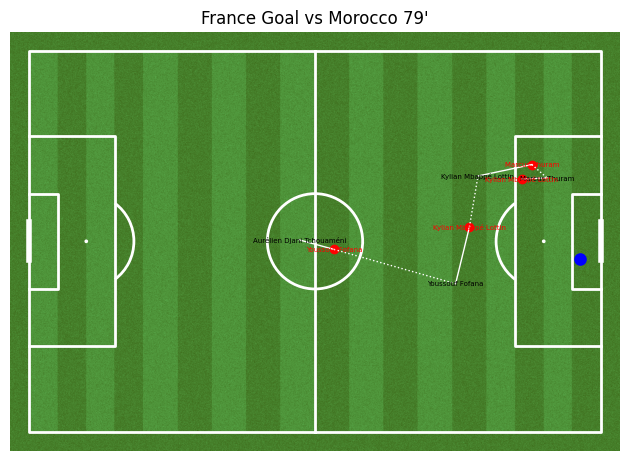

In [2426]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal13.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal13['X'], Fr_goal13['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal13['X_pass_end'], Fr_goal13['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal13) - 1):
    x_start = Fr_goal13.iloc[i]['X_pass_end']
    y_start = Fr_goal13.iloc[i]['Y_pass_end']
    x_end = Fr_goal13.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal13.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Morocco 79'" )

# Show the plot
plt.show()

### France vs Argentina

In [2427]:
game_ArvFr= merged_df[merged_df['match_id'] == 3869685]
game_ArvFr = game_ArvFr.sort_values('minute')
game_ArvFr = game_ArvFr.reset_index(drop = True)

game_ArvFr[game_ArvFr['shot_outcome']== 'Goal']

,match_id,match_date,home_team,away_team,home_score,away_score,team,player,pass_recipient,timestamp,...,Y_pass_end,shot_outcome,player_id,type,X,Y,color,round_minute,penalty,goal_number
211,3869685,2022-12-18,Argentina,France,3,3,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:22:24.114,...,NaN,Goal,5503.0,Shot,108.0,40.0,blue,23,Yes,25
327,3869685,2022-12-18,Argentina,France,3,3,Argentina,Ángel Fabián Di María Hernández,NaN,2023-12-16 00:35:22.647,...,NaN,Goal,2995.0,Shot,111.8,32.1,blue,36,No,25
777,3869685,2022-12-18,Argentina,France,3,3,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:34:24.975,...,NaN,Goal,3009.0,Shot,108.0,40.0,red,80,Yes,26
796,3869685,2022-12-18,Argentina,France,3,3,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:35:59.025,...,NaN,Goal,3009.0,Shot,104.8,30.1,red,81,No,26
1059,3869685,2022-12-18,Argentina,France,3,3,Argentina,Lionel Andrés Messi Cuccittini,NaN,2023-12-16 00:02:58.079,...,NaN,Goal,5503.0,Shot,116.6,43.0,blue,108,No,25
1084,3869685,2022-12-18,Argentina,France,3,3,France,Kylian Mbappé Lottin,NaN,2023-12-16 00:12:05.189,...,NaN,Goal,3009.0,Shot,108.0,40.0,red,118,Yes,26


In [2428]:
Fr_goal14 = game_ArvFr[791:797]
Fr_goal15 = game_ArvFr[1078:1085]

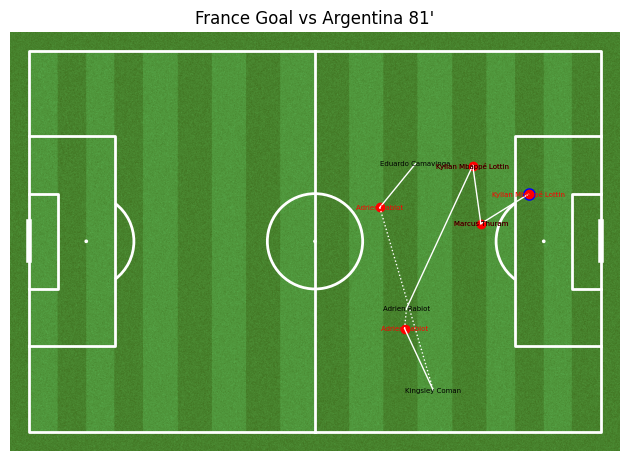

In [2429]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal14.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal14['X'], Fr_goal14['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal14['X_pass_end'], Fr_goal14['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal14) - 1):
    x_start = Fr_goal14.iloc[i]['X_pass_end']
    y_start = Fr_goal14.iloc[i]['Y_pass_end']
    x_end = Fr_goal14.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal14.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Argentina 81'" )

# Show the plot
plt.show()

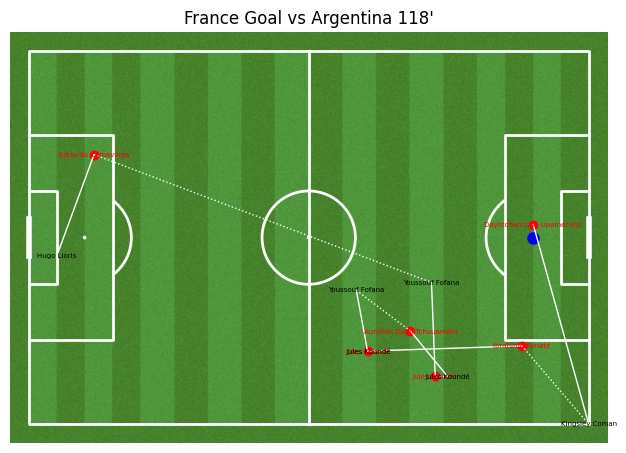

In [2430]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)

# Create a soccer field plot
fig, ax = pitch.draw()

# Draw the passes on the soccer field with annotations for both pass start and pass end
for i, row in Fr_goal15.iterrows():
    ax.plot([row['X_pass_start'], row['X_pass_end']], [row['Y_pass_start'], row['Y_pass_end']], color='white', linewidth=1)

    # Annotate pass start player
    ax.annotate(row['player'], (row['X_pass_start'], row['Y_pass_start']),
                color='black', ha='center', va='center', fontsize=5)

    # Annotate pass end player
    ax.annotate(row['pass_recipient'], (row['X_pass_end'], row['Y_pass_end']),
                color='red', ha='center', va='center', fontsize=5)

# Plot passes as scatter points
ax.scatter(Fr_goal15['X'], Fr_goal15['Y'], c='blue', marker='o',s=65, label='Pass Start')
ax.scatter(Fr_goal15['X_pass_end'], Fr_goal15['Y_pass_end'], c='red', marker='o', label='Pass End')


for i in range(len(Fr_goal15) - 1):
    x_start = Fr_goal15.iloc[i]['X_pass_end']
    y_start = Fr_goal15.iloc[i]['Y_pass_end']
    x_end = Fr_goal15.iloc[i + 1]['X_pass_start']
    y_end = Fr_goal15.iloc[i + 1]['Y_pass_start']
    ax.plot([x_start, x_end], [y_start, y_end], linestyle='dotted', color='white', linewidth=1)
    
ax.set_title("France Goal vs Argentina 118'" )

# Show the plot
plt.show()

### NetworkX

In [2431]:
%matplotlib inline

In [2432]:
edge_list_df = Arg_goal1[['player', 'pass_recipient']]

edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])

edge_list_df.head(10)

,player,pass_recipient
671,Lionel Andrés Messi Cuccittini,NaN
670,Ángel Fabián Di María Hernández,Lionel Andrés Messi Cuccittini
669,Enzo Fernandez,Ángel Fabián Di María Hernández
668,Lionel Andrés Messi Cuccittini,Enzo Fernandez
667,Ángel Fabián Di María Hernández,Lionel Andrés Messi Cuccittini
666,Nahuel Molina Lucero,Ángel Fabián Di María Hernández
665,Enzo Fernandez,Nahuel Molina Lucero
664,Damián Emiliano Martínez,Enzo Fernandez


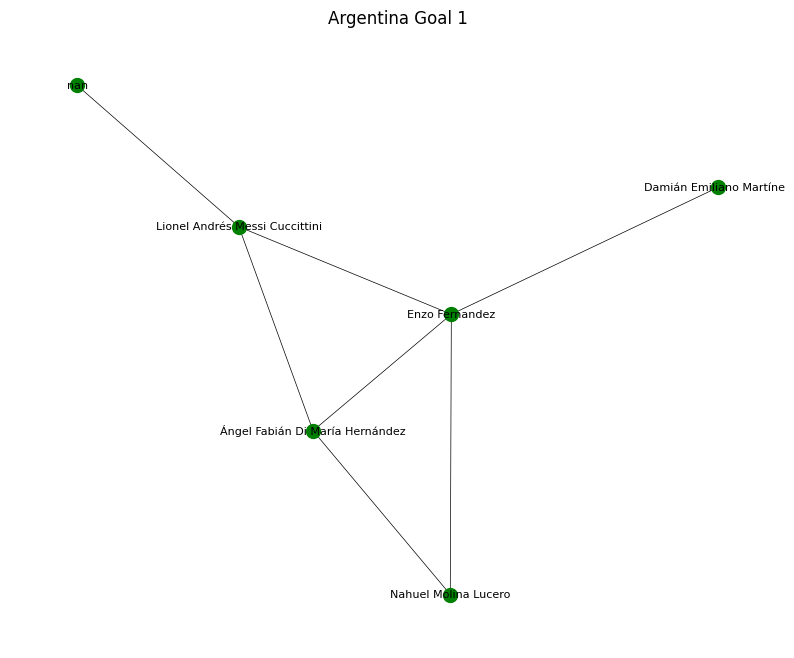

Edge: nan -> Lionel Andrés Messi Cuccittini, Weight: 10
Edge: Ángel Fabián Di María Hernández -> Lionel Andrés Messi Cuccittini, Weight: 9
Edge: Enzo Fernandez -> Lionel Andrés Messi Cuccittini, Weight: 8
Edge: Enzo Fernandez -> Ángel Fabián Di María Hernández, Weight: 7
Edge: Nahuel Molina Lucero -> Ángel Fabián Di María Hernández, Weight: 6
Edge: Nahuel Molina Lucero -> Enzo Fernandez, Weight: 5
Edge: Damián Emiliano Martínez -> Enzo Fernandez, Weight: 4


In [2433]:
edge_list_df = Arg_goal1[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 1')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df = pd.DataFrame(edge_data)



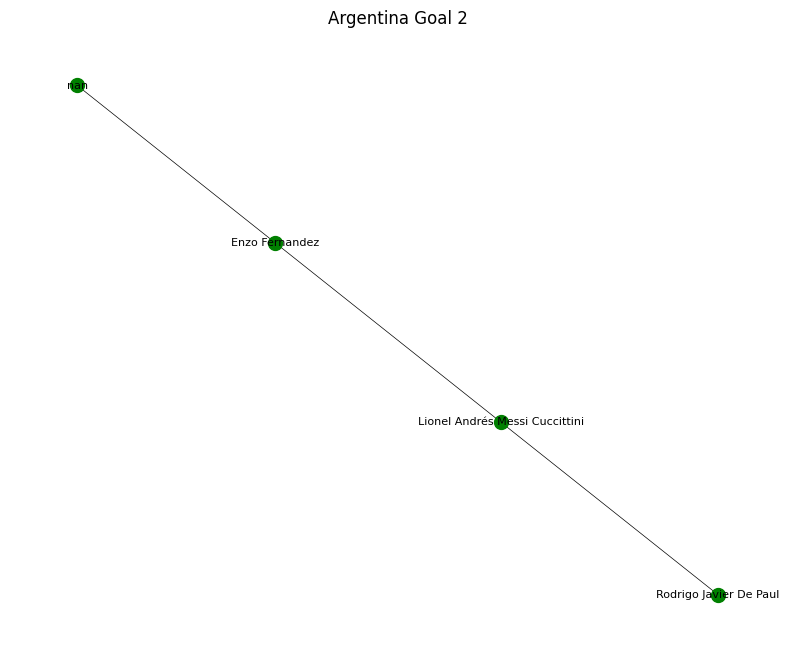

Edge: nan -> Enzo Fernandez, Weight: 10
Edge: Lionel Andrés Messi Cuccittini -> Enzo Fernandez, Weight: 9
Edge: Rodrigo Javier De Paul -> Lionel Andrés Messi Cuccittini, Weight: 8


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/386817854.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2434]:
edge_list_df = Arg_goal2[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 2')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

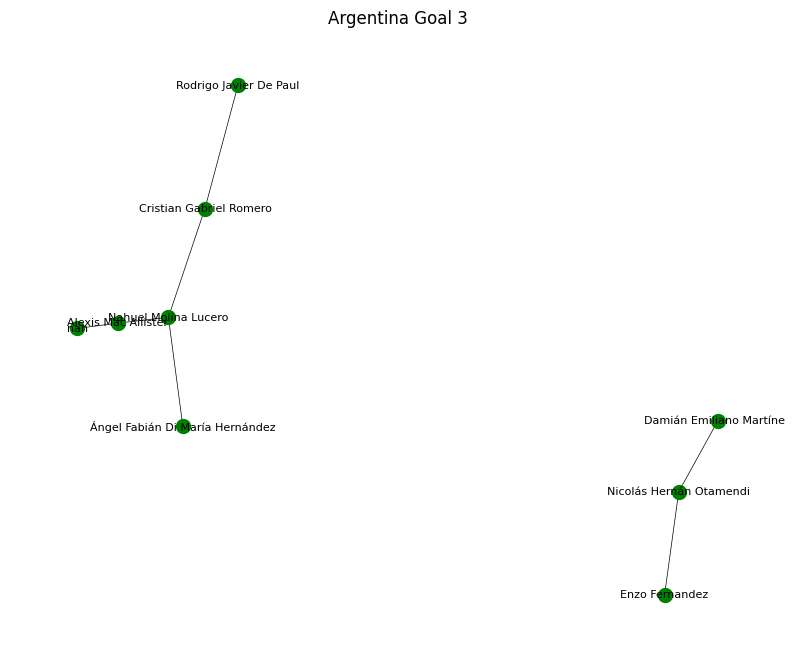

Edge: nan -> Alexis Mac Allister, Weight: 10
Edge: Nahuel Molina Lucero -> Alexis Mac Allister, Weight: 9
Edge: Ángel Fabián Di María Hernández -> Nahuel Molina Lucero, Weight: 8
Edge: Cristian Gabriel Romero -> Nahuel Molina Lucero, Weight: 7
Edge: Nicolás Hernán Otamendi -> Enzo Fernandez, Weight: 6
Edge: Damián Emiliano Martínez -> Nicolás Hernán Otamendi, Weight: 5
Edge: Rodrigo Javier De Paul -> Cristian Gabriel Romero, Weight: 4


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/922889490.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2)


In [2435]:
edge_list_df = Arg_goal3[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 3')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df2 = pd.DataFrame(edge_data)

df = df.append(df2)

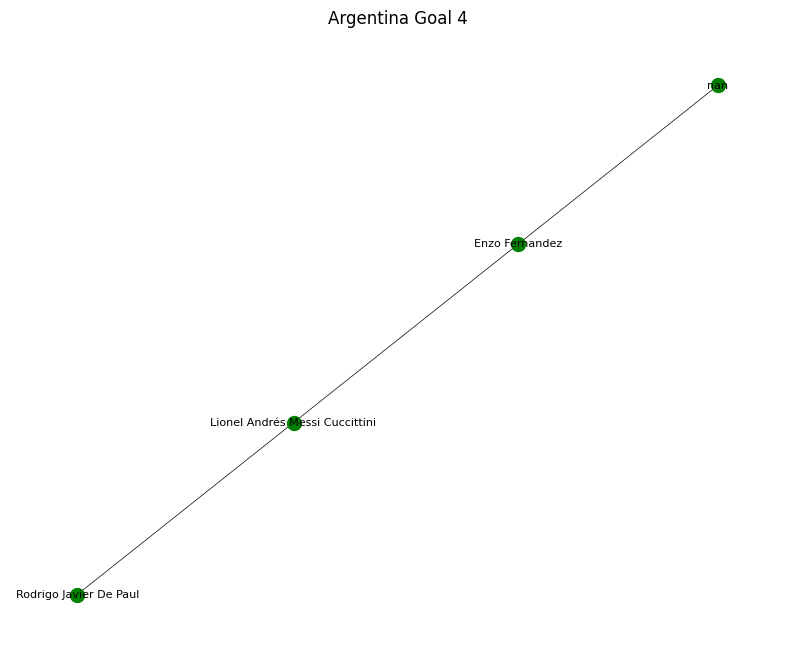

Edge: nan -> Enzo Fernandez, Weight: 10
Edge: Lionel Andrés Messi Cuccittini -> Enzo Fernandez, Weight: 9
Edge: Rodrigo Javier De Paul -> Lionel Andrés Messi Cuccittini, Weight: 8


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/2944084190.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2436]:
edge_list_df = Arg_goal2[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 4')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

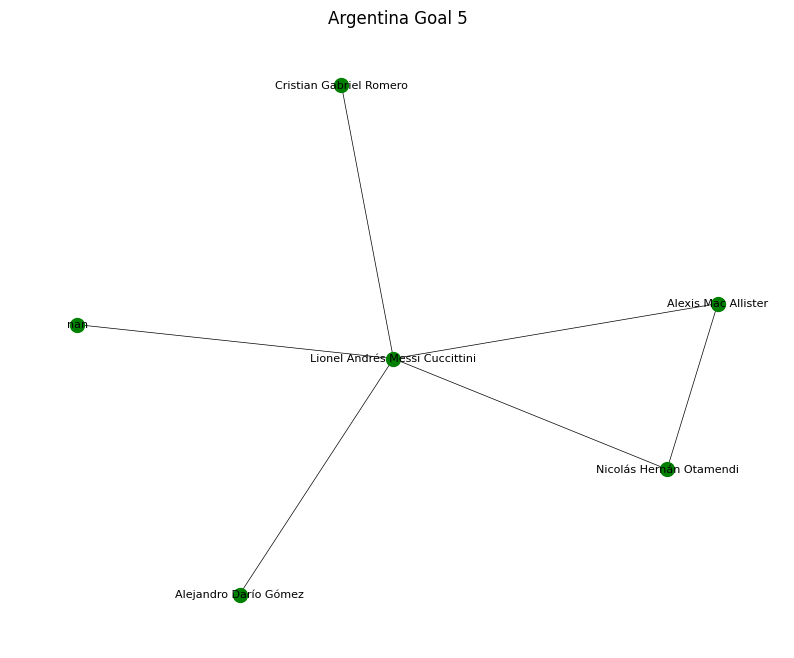

Edge: nan -> Lionel Andrés Messi Cuccittini, Weight: 10
Edge: Nicolás Hernán Otamendi -> Lionel Andrés Messi Cuccittini, Weight: 9
Edge: Alexis Mac Allister -> Lionel Andrés Messi Cuccittini, Weight: 8
Edge: Alejandro Darío Gómez -> Lionel Andrés Messi Cuccittini, Weight: 7
Edge: Cristian Gabriel Romero -> Lionel Andrés Messi Cuccittini, Weight: 6
Edge: Alexis Mac Allister -> Nicolás Hernán Otamendi, Weight: 5


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/1755747627.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2437]:
edge_list_df = Arg_goal5[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 5')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

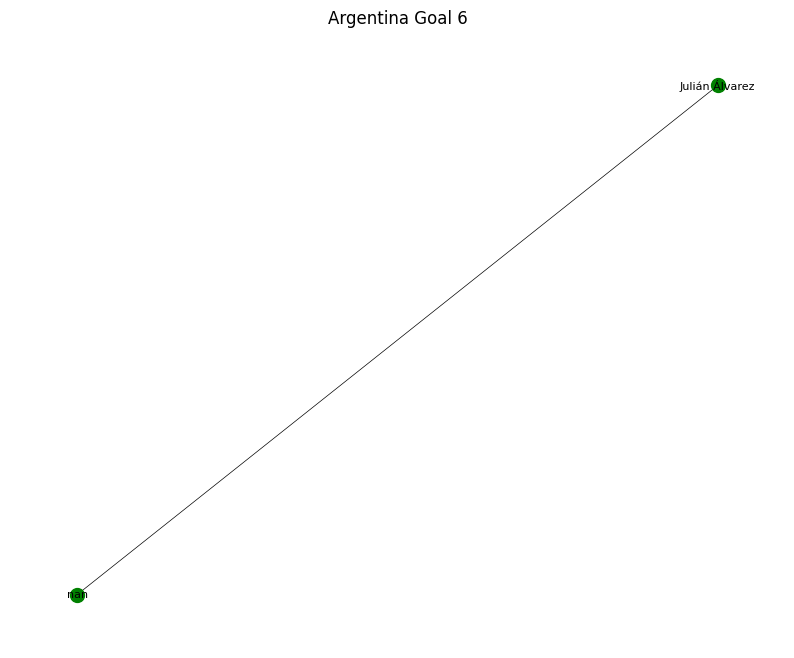

Edge: nan -> Julián Álvarez, Weight: 10


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/4041018844.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2438]:
edge_list_df = Arg_goal6[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 6')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

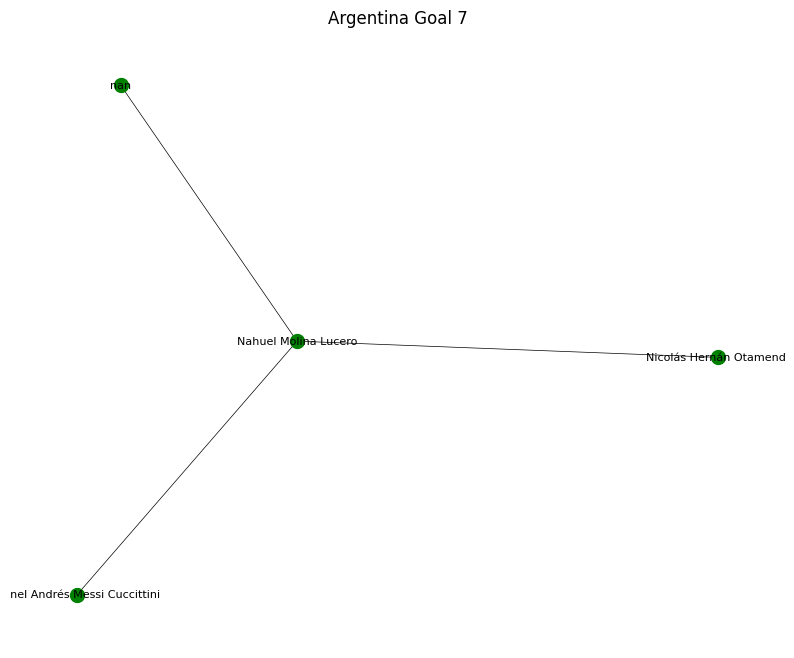

Edge: nan -> Nahuel Molina Lucero, Weight: 10
Edge: Lionel Andrés Messi Cuccittini -> Nahuel Molina Lucero, Weight: 9
Edge: Nicolás Hernán Otamendi -> Nahuel Molina Lucero, Weight: 8


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/1504722614.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2439]:
edge_list_df = Arg_goal7[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 7')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

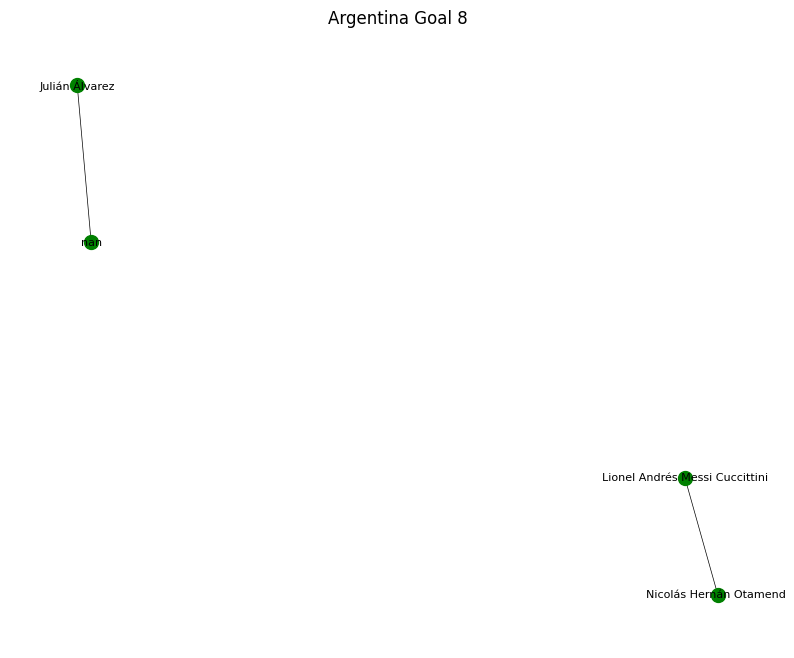

Edge: nan -> Julián Álvarez, Weight: 10
Edge: Lionel Andrés Messi Cuccittini -> Nicolás Hernán Otamendi, Weight: 9


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/3922955712.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2440]:
edge_list_df = Arg_goal8[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 8')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

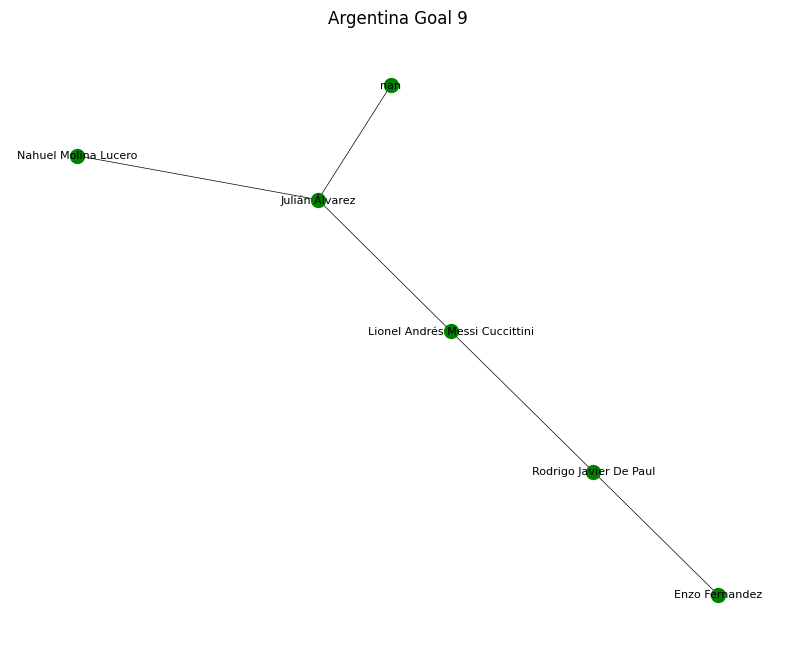

Edge: nan -> Julián Álvarez, Weight: 10
Edge: Lionel Andrés Messi Cuccittini -> Julián Álvarez, Weight: 9
Edge: Nahuel Molina Lucero -> Julián Álvarez, Weight: 8
Edge: Rodrigo Javier De Paul -> Lionel Andrés Messi Cuccittini, Weight: 7
Edge: Enzo Fernandez -> Rodrigo Javier De Paul, Weight: 6


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/3793274658.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2441]:
edge_list_df = Arg_goal9[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 9')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

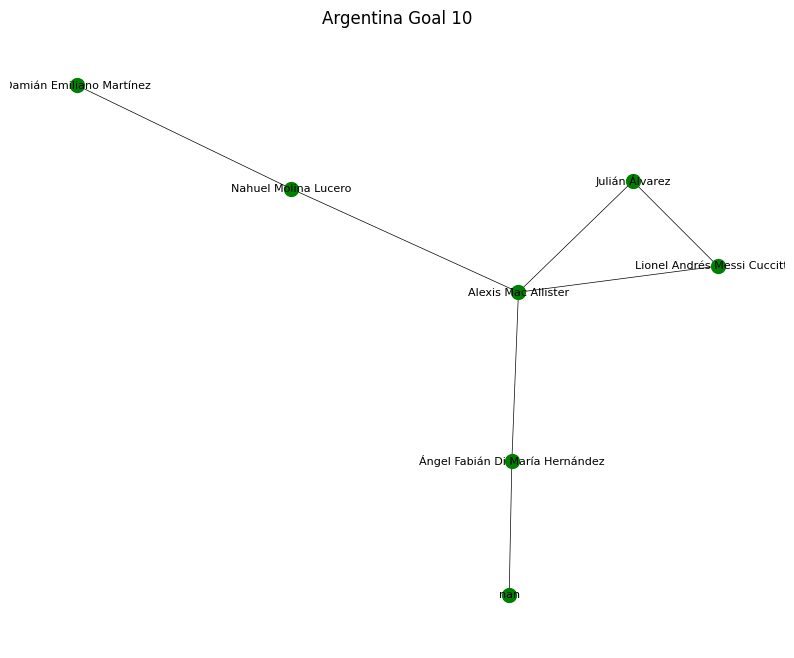

Edge: nan -> Ángel Fabián Di María Hernández, Weight: 10
Edge: Alexis Mac Allister -> Ángel Fabián Di María Hernández, Weight: 9
Edge: Julián Álvarez -> Alexis Mac Allister, Weight: 8
Edge: Lionel Andrés Messi Cuccittini -> Alexis Mac Allister, Weight: 7
Edge: Nahuel Molina Lucero -> Alexis Mac Allister, Weight: 6
Edge: Lionel Andrés Messi Cuccittini -> Julián Álvarez, Weight: 5
Edge: Damián Emiliano Martínez -> Nahuel Molina Lucero, Weight: 4


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/2829701735.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2442]:
edge_list_df = Arg_goal10[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 10')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

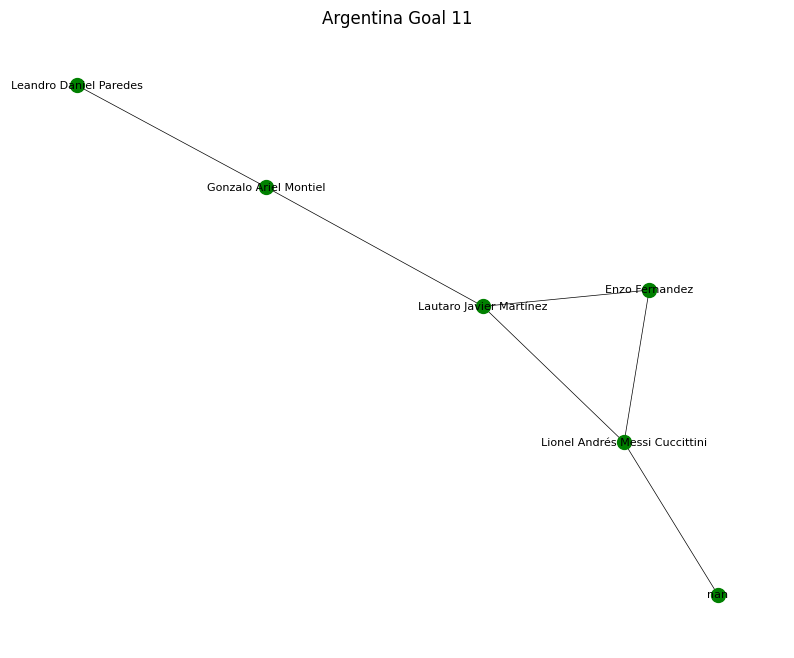

Edge: nan -> Lionel Andrés Messi Cuccittini, Weight: 10
Edge: Lautaro Javier Martínez -> Lionel Andrés Messi Cuccittini, Weight: 9
Edge: Enzo Fernandez -> Lionel Andrés Messi Cuccittini, Weight: 8
Edge: Lautaro Javier Martínez -> Enzo Fernandez, Weight: 7
Edge: Gonzalo Ariel Montiel -> Lautaro Javier Martínez, Weight: 6
Edge: Leandro Daniel Paredes -> Gonzalo Ariel Montiel, Weight: 5


/var/folders/kf/8556syz14vn70lw4383jfz_c0000gn/T/ipykernel_2758/2748459586.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df1)


In [2443]:
edge_list_df = Arg_goal11[['player', 'pass_recipient']]
edge_list_df = edge_list_df.reindex(index = edge_list_df.index[::-1])
edge_list1 = list(edge_list_df.itertuples(index=False, name=None))

G = nx.from_edgelist(edge_list1)

edge_data = {'First_Node': [], 'Weight': []}

# Add weights sequentially based on the descending order of weights
for i, edge in enumerate(G.edges(data=True)):
    edge_data['First_Node'].append(edge[1])
    edge_data['Weight'].append(10 - i)
    G[edge[1]][edge[0]]['weight'] = 10- i

# Create a figure with a white background for the networkx graph
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('white')

# Draw the networkx graph with edge colors
pos = nx.spring_layout(G)
nx.draw(G, ax=ax, pos=pos, with_labels=True, font_size=8, node_size=100, node_color='green', width=0.5, arrowsize=10)

# Show the plot
plt.title('Argentina Goal 11')
plt.show()


for edge in G.edges(data=True):
    print(f"Edge: {edge[1]} -> {edge[0]}, Weight: {edge[2]['weight']}")
    
df1 = pd.DataFrame(edge_data)

df = df.append(df1)

In [2444]:
df = df.dropna()

df.head()

,First_Node,Weight
1,Ángel Fabián Di María Hernández,9
2,Enzo Fernandez,8
3,Enzo Fernandez,7
4,Nahuel Molina Lucero,6
5,Nahuel Molina Lucero,5


In [2445]:
sum_df = df.groupby('First_Node').sum()
sum_df = sum_df.sort_values(by = 'Weight', ascending = False)
sum_df

,Weight
First_Node,
Lionel Andrés Messi Cuccittini,57
Nahuel Molina Lucero,34
Enzo Fernandez,29
Rodrigo Javier De Paul,27
Nicolás Hernán Otamendi,23
Alexis Mac Allister,22
Ángel Fabián Di María Hernández,17
Lautaro Javier Martínez,16
Cristian Gabriel Romero,13
